In [1]:
import matplotlib.pyplot as plt
import sys

# tensorflowのロード
import tensorflow as tf
import numpy as np

In [2]:
# MNISTデータのダウンロード
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("MNIST_data", one_hot=True)

W0718 17:19:41.009543 139980194514688 deprecation.py:323] From <ipython-input-2-6883c9616e56>:3: read_data_sets (from tensorflow.contrib.learn.python.learn.datasets.mnist) is deprecated and will be removed in a future version.
Instructions for updating:
Please use alternatives such as official/mnist/dataset.py from tensorflow/models.
W0718 17:19:41.012046 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/contrib/learn/python/learn/datasets/mnist.py:260: maybe_download (from tensorflow.contrib.learn.python.learn.datasets.base) is deprecated and will be removed in a future version.
Instructions for updating:
Please write your own downloading logic.
W0718 17:19:41.028193 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/contrib/learn/python/learn/datasets/mnist.py:262: extract_images (from tensorflow.contrib.learn.python.learn.datasets.mnist) is deprecated and will be removed in a f

Extracting MNIST_data/train-images-idx3-ubyte.gz


W0718 17:19:41.254369 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/contrib/learn/python/learn/datasets/mnist.py:267: extract_labels (from tensorflow.contrib.learn.python.learn.datasets.mnist) is deprecated and will be removed in a future version.
Instructions for updating:
Please use tf.data to implement this functionality.
W0718 17:19:41.259860 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/contrib/learn/python/learn/datasets/mnist.py:110: dense_to_one_hot (from tensorflow.contrib.learn.python.learn.datasets.mnist) is deprecated and will be removed in a future version.
Instructions for updating:
Please use tf.one_hot on tensors.
W0718 17:19:41.312349 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/contrib/learn/python/learn/datasets/mnist.py:290: DataSet.__init__ (from tensorflow.contrib.learn.python.learn.datasets.

Extracting MNIST_data/train-labels-idx1-ubyte.gz
Extracting MNIST_data/t10k-images-idx3-ubyte.gz
Extracting MNIST_data/t10k-labels-idx1-ubyte.gz


In [3]:
# 補助関数の定義
# 1次元ベクトル化
def tensor_to_vector(input):
    shape = input.get_shape()[1:].as_list()
    dim = np.prod(shape)
    return tf.reshape(input, [-1, dim]), dim

# leaky ReLU活性化関数
def leaky_relu(input):
    return tf.maximum(0.2*input, input)

In [4]:
# DCGANクラスの定義
class DCGAN():
    def __init__(
            self,
            batch_size=100,
            image_shape=[28,28,1],
            dim_z=100,
            dim_W1=1024,
            dim_W2=128,
            dim_W3=64,
            dim_ch=1,
            ):
        # クラス内変数の初期化
        self.batch_size = batch_size
        self.image_shape = image_shape
        self.dim_z = dim_z
        self.dim_W1 = dim_W1
        self.dim_W2 = dim_W2
        self.dim_W3 = dim_W3
        self.dim_ch = dim_ch
        # TensorFlow内学習係数の定義
        ## Generator
        self.g_W1 = tf.Variable(tf.random_normal([dim_z, dim_W1], stddev=0.02), name="g_W1")
        self.g_b1 = tf.Variable(tf.random_normal([dim_W1], stddev=0.02), name="g_b1")
        self.g_W2 = tf.Variable(tf.random_normal([dim_W1, dim_W2*7*7], stddev=0.02), name="g_W2")
        self.g_b2 = tf.Variable(tf.random_normal([dim_W2*7*7], stddev=0.02), name="g_b2")
        self.g_W3 = tf.Variable(tf.random_normal([5, 5, dim_W3, dim_W2], stddev=0.02), name="g_W3")
        self.g_b3 = tf.Variable(tf.random_normal([dim_W3], stddev=0.02), name="g_b3")
        self.g_W4 = tf.Variable(tf.random_normal([5, 5, dim_ch, dim_W3], stddev=0.02), name="g_W4")
        self.g_b4 = tf.Variable(tf.random_normal([dim_ch], stddev=0.02), name="g_b4")
        ## Discriminator
        self.d_W1 = tf.Variable(tf.random_normal([5,5,dim_ch,dim_W3], stddev=0.02), name="d_W1")
        self.d_b1 = tf.Variable(tf.random_normal([dim_W3], stddev=0.02), name="d_b1")
        self.d_W2 = tf.Variable(tf.random_normal([5,5,dim_W3,dim_W2], stddev=0.02), name="d_W2")
        self.d_b2 = tf.Variable(tf.random_normal([dim_W2], stddev=0.02), name="d_b2")
        self.d_W3 = tf.Variable(tf.random_normal([dim_W2*7*7,dim_W1], stddev=0.02), name="d_W3")
        self.d_b3 = tf.Variable(tf.random_normal([dim_W1], stddev=0.02), name="d_b3")
        self.d_W4 = tf.Variable(tf.random_normal([dim_W1, 1], stddev=0.02), name="d_W4")
        self.d_b4 = tf.Variable(tf.random_normal([1], stddev=0.02), name="d_b4")
        
    def build_model(self):
        # プレースホルダーの用意
        Z = tf.placeholder(tf.float32, [self.batch_size, self.dim_z])  # Generatorへの入力
        # 画像の用意
        img_real = tf.placeholder(tf.float32, [self.batch_size]+self.image_shape)  # Discriminatorへの入力
        img_gen = self.generate(Z)
        # 出力
        raw_real = self.discriminate(img_real)
        raw_gen = self.discriminate(img_gen)
        # 確率
        p_real = tf.nn.sigmoid(raw_real)
        p_gen = tf.nn.sigmoid(raw_gen)
        # コスト関数の定義
        discrim_cost = tf.reduce_mean(
            -tf.reduce_sum(tf.log(p_real) + \
                           tf.log(tf.ones(self.batch_size, tf.float32) - p_gen), axis=1))
        gen_cost = tf.reduce_mean(-tf.reduce_sum(tf.log(p_gen), axis=1))
        
        return Z, img_real, discrim_cost, gen_cost, p_real, p_gen
        
    def generate(self, Z):
        # 1層目
        fc1 = tf.matmul(Z, self.g_W1) + self.g_b1
        bm1, bv1 = tf.nn.moments(fc1, axes=[0])
        bn1 = tf.nn.batch_normalization(fc1, bm1, bv1, None, None, 1e-5)
        relu1 = tf.nn.relu(bn1)
        # 2層目
        fc2 = tf.matmul(relu1, self.g_W2) + self.g_b2
        bm2, bv2 = tf.nn.moments(fc2, axes=[0])
        bn2 = tf.nn.batch_normalization(fc2, bm2, bv2, None, None, 1e-5)
        relu2 = tf.nn.relu(bn2)
        # [batch, dim_W2*7*7] -> [batch, 7, 7, dim_W2]
        y2 = tf.reshape(relu2, [self.batch_size, 7,7,self.dim_W2])
        # 3層目
        conv_t1 = tf.nn.conv2d_transpose(y2, self.g_W3, strides=[1,2,2,1],
                                         output_shape=[self.batch_size, 14,14,self.dim_W3]) + self.g_b3
        bm3,bv3 = tf.nn.moments(conv_t1, axes=[0, 1, 2])
        bn3 = tf.nn.batch_normalization(conv_t1, bm3, bv3, None, None, 1e-5)
        relu3 = tf.nn.relu(bn3)
        # 4層目
        conv_t2 = tf.nn.conv2d_transpose(relu3, self.g_W4, strides=[1,2,2,1],
                                         output_shape=[self.batch_size, 28, 28, self.dim_ch]) + self.g_b4
        img = tf.nn.sigmoid(conv_t2)
        
        return img
    
    def discriminate(self, img):
        # 1層目
        conv1 = tf.nn.conv2d(img, self.d_W1, strides=[1,2,2,1], padding="SAME") + self.d_b1
        y1 = leaky_relu(conv1)
        # 2層目
        conv2 = tf.nn.conv2d(y1, self.d_W2, strides=[1,2,2,1], padding="SAME") + self.d_b2
        y2 = leaky_relu(conv2)
        # 3層目
        vec, _ = tensor_to_vector(y2)
        fc1 = tf.matmul(vec, self.d_W3) + self.d_b3
        y3 = leaky_relu(fc1)
        # 4層目
        fc2 = tf.matmul(y3, self.d_W4) + self.d_b4
        #y4 = tf.nn.sigmoid(fc2)
        
        return fc2
    
    def generate_samples(self, batch_size):
        # ここでは指定したbatch_sizeでサンプルを生成するため，self.batch_sizeは使わない
        Z = tf.placeholder(tf.float32, [batch_size, self.dim_z])
        # 1層目
        fc1 = tf.matmul(Z, self.g_W1) + self.g_b1
        bm1, bv1 = tf.nn.moments(fc1, axes=[0])
        bn1 = tf.nn.batch_normalization(fc1, bm1, bv1, None, None, 1e-5)
        relu1 = tf.nn.relu(bn1)
        # 2層目
        fc2 = tf.matmul(relu1, self.g_W2) + self.g_b2
        bm2, bv2 = tf.nn.moments(fc2, axes=[0])
        bn2 = tf.nn.batch_normalization(fc2, bm2, bv2, None, None, 1e-5)
        relu2 = tf.nn.relu(bn2)
        # [batch, dim_W2*7*7] -> [batch, 7, 7, dim_W2]
        y2 = tf.reshape(relu2, [batch_size, 7,7,self.dim_W2])
        # 3層目
        conv_t1 = tf.nn.conv2d_transpose(y2, self.g_W3, strides=[1,2,2,1],
                                         output_shape=[batch_size, 14,14,self.dim_W3]) + self.g_b3
        bm3,bv3 = tf.nn.moments(conv_t1, axes=[0, 1, 2])
        bn3 = tf.nn.batch_normalization(conv_t1, bm3, bv3, None, None, 1e-5)
        relu3 = tf.nn.relu(bn3)
        # 4層目
        conv_t2 = tf.nn.conv2d_transpose(relu3, self.g_W4, strides=[1,2,2,1],
                                         output_shape=[batch_size, 28, 28, self.dim_ch]) + self.g_b4
        img = tf.nn.sigmoid(conv_t2)
        return Z, img


In [5]:
# モデルの構築
dcgan_model = DCGAN(batch_size=128, image_shape=[28,28,1])
Z_tf, image_tf, d_cost_tf, g_cost_tf, p_real, p_gen = dcgan_model.build_model()
Z_gen, image_gen = dcgan_model.generate_samples(batch_size=32)

In [6]:
# セッション開始
sess = tf.InteractiveSession()
saver = tf.train.Saver(max_to_keep=10)

# tensorflow変数の準備
discrim_vars = [x for x in tf.trainable_variables() if "d_" in x.name]
gen_vars = [x for x in tf.trainable_variables() if "g_" in x.name]
# 最適化メソッドの用意
optimizer_d = tf.train.AdamOptimizer(0.0002, beta1=0.5).minimize(d_cost_tf, var_list=discrim_vars)
optimizer_g = tf.train.AdamOptimizer(0.0002, beta1=0.5).minimize(g_cost_tf, var_list=gen_vars)



W0718 17:19:42.896239 139980194514688 deprecation.py:323] From /home/tsuzuki/anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [7]:
# TensorFlow内のグローバル変数の初期化
tf.global_variables_initializer().run()

from matplotlib import pyplot as plt

# 生成画像の可視化
def visualize(images, num_itr, rows, cols):
    # タイトル表示
    plt.title(num_itr, color="red")
    for index, data in enumerate(images):
        # 画像データはrows * colsの行列上に配置
        plt.subplot(rows, cols, index + 1)
        # 軸表示は無効
        plt.axis("off")
        # データをグレースケール画像として表示
        plt.imshow(data.reshape(28,28), cmap="gray", interpolation="nearest")
    plt.show()


In [8]:
  # 学習
def train(train_imgs, n_epochs, batch_size):
    itr = 0
    for epoch in range(n_epochs):
        index = np.arange(len(train_imgs))
        np.random.shuffle(index)
        trX = train_imgs[index]
        
        # batch_size毎のfor
        for start, end in zip(
                range(0, len(trX), batch_size),
                range(batch_size, len(trX), batch_size)):
            # 画像は0-1に正規化
            Xs = trX[start:end].reshape([-1, 28,28,1]) / 255.
            Zs = np.random.uniform(-1,1, size=[batch_size, dcgan_model.dim_z]).astype(np.float32)
            
            if np.mod(itr, 2) != 0 :
                # 偶数番目はGeneratorを学習
                _, gen_loss_val = sess.run([optimizer_g, g_cost_tf], feed_dict={Z_tf:Zs})
                discrim_loss_val, p_real_val, p_gen_val \
                        = sess.run([d_cost_tf, p_real, p_gen], feed_dict={Z_tf:Zs, image_tf:Xs})
                #print("=========== updating G ==========")
                #print("iteration:", itr)
                #print("gen loss:", gen_loss_val)
                #print("discrim loss:", discrim_loss_val)
            else:
                # 奇数番目はDiscriminatorを学習
                _, discrim_loss_val = sess.run([optimizer_d, d_cost_tf],
                                               feed_dict={Z_tf:Zs, image_tf:Xs})
                gen_loss_val, p_real_val, p_gen_val = sess.run([g_cost_tf, p_real, p_gen], 
                                                               feed_dict={Z_tf:Zs, image_tf:Xs})
                #print("=========== updating D ==========")
                #print("iteration:", itr)
                #print("gen loss:", gen_loss_val)
                #print("discrim loss:", discrim_loss_val)
                
            
            #print("Average P(real)=", p_real_val.mean())
            #print("Average P(gen)=", p_gen_val.mean())
            itr += 1
        
        # サンプルを表示
        z = np.random.uniform(-1,1, size=[32, dcgan_model.dim_z]).astype(np.float32)
        generated_samples = sess.run([image_gen], feed_dict={Z_gen:z})
        #plt.imshow(generated_samples[0][0].reshape(28,28), cmap="gray", interpolation="nearest")
        visualize(generated_samples[0], epoch, 4,8)
        print("epoch = ", epoch)

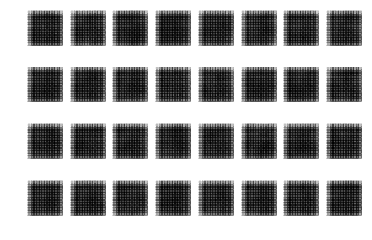

epoch =  0


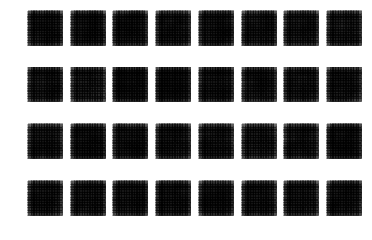

epoch =  1


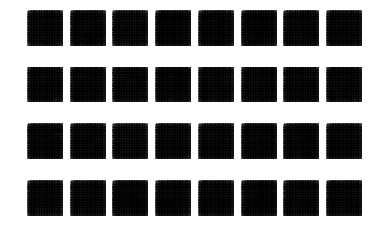

epoch =  2


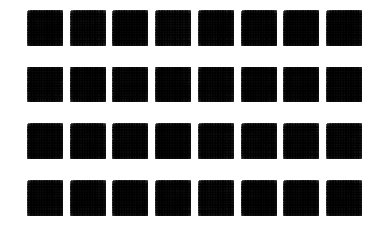

epoch =  3


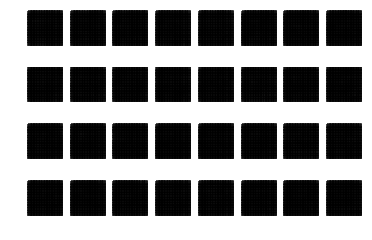

epoch =  4


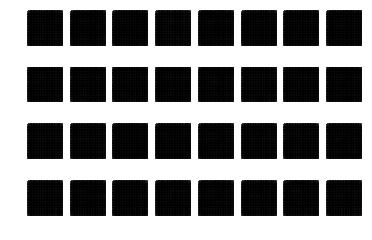

epoch =  5


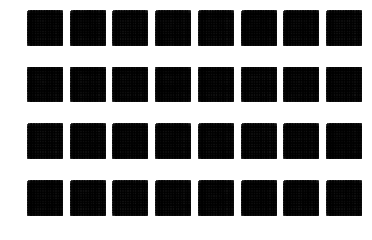

epoch =  6


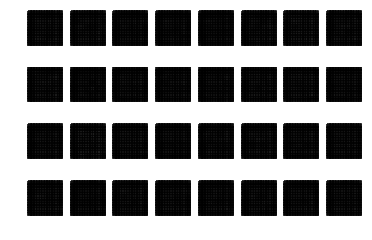

epoch =  7


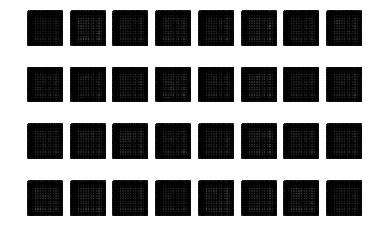

epoch =  8


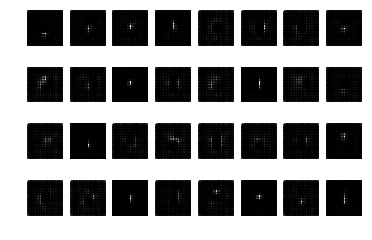

epoch =  9


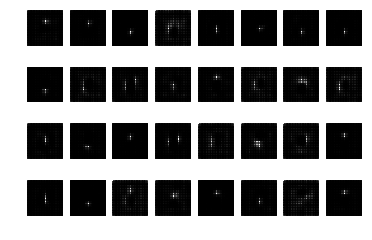

epoch =  10


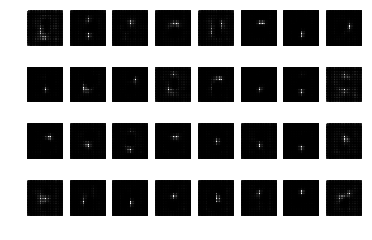

epoch =  11


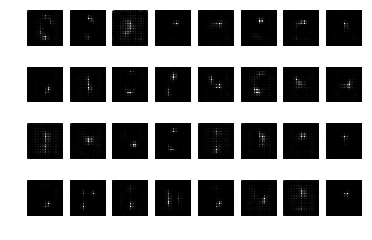

epoch =  12


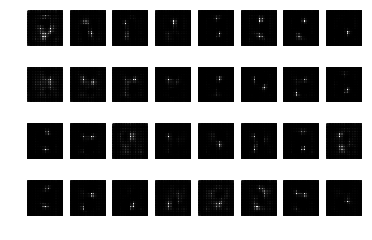

epoch =  13


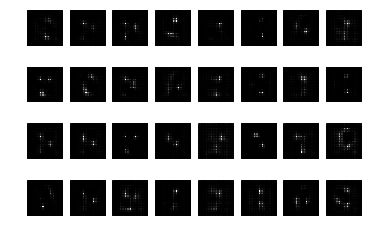

epoch =  14


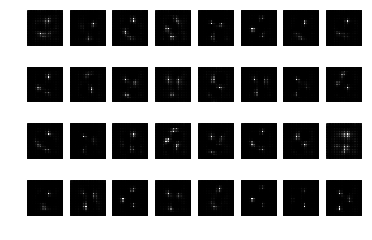

epoch =  15


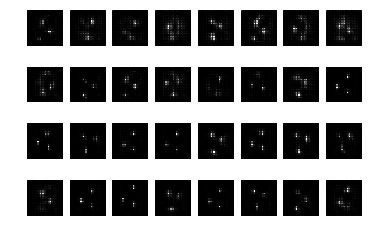

epoch =  16


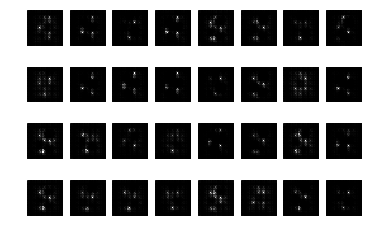

epoch =  17


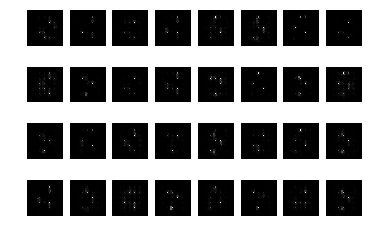

epoch =  18


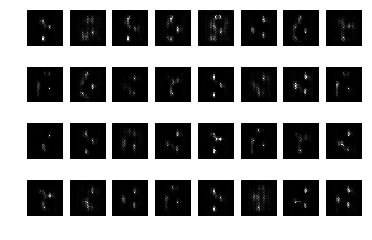

epoch =  19


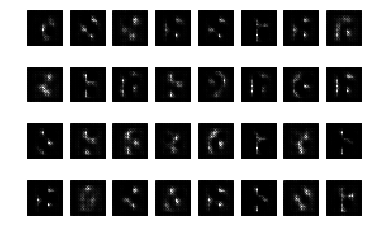

epoch =  20


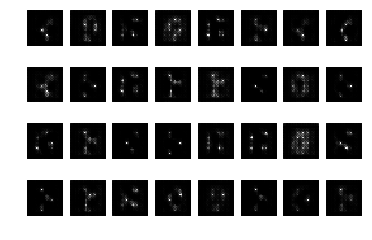

epoch =  21


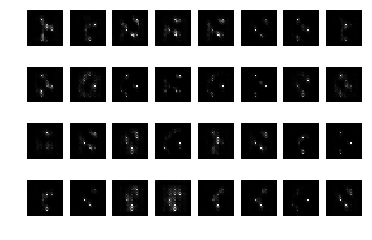

epoch =  22


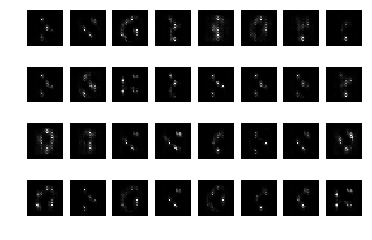

epoch =  23


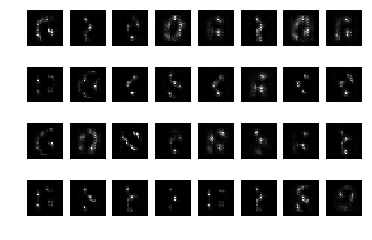

epoch =  24


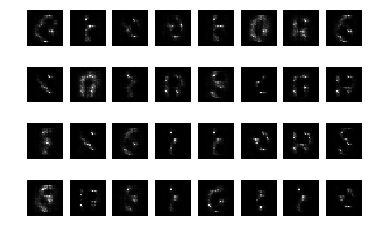

epoch =  25


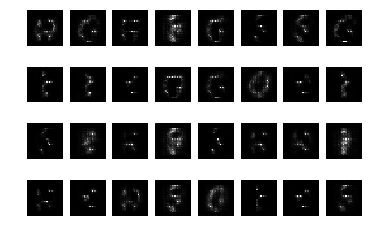

epoch =  26


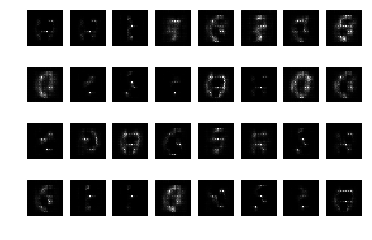

epoch =  27


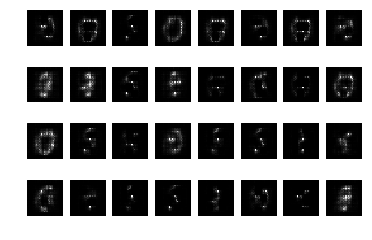

epoch =  28


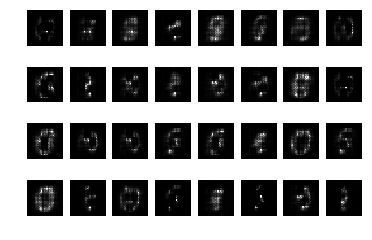

epoch =  29


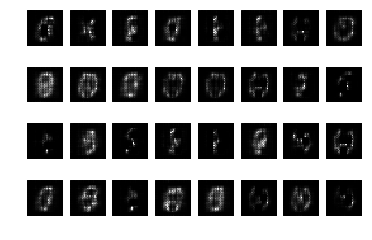

epoch =  30


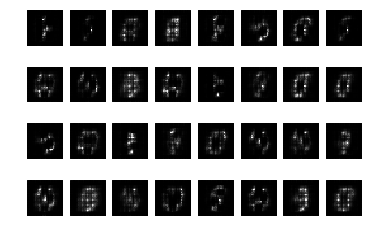

epoch =  31


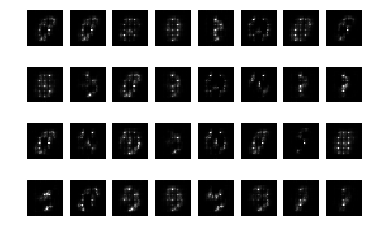

epoch =  32


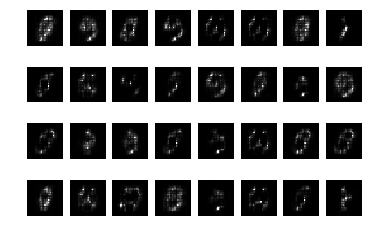

epoch =  33


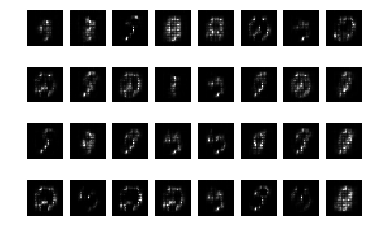

epoch =  34


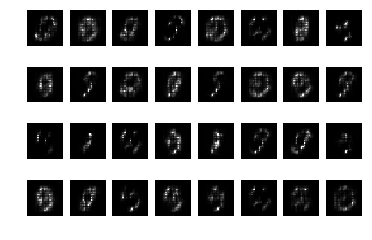

epoch =  35


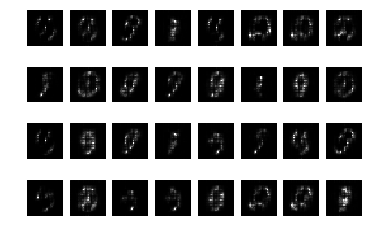

epoch =  36


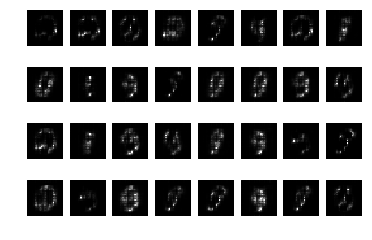

epoch =  37


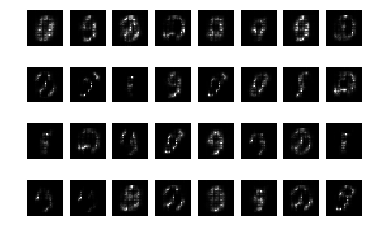

epoch =  38


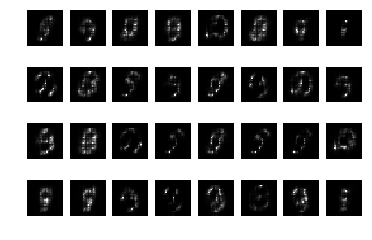

epoch =  39


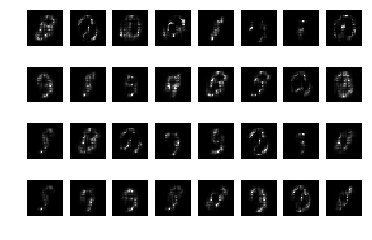

epoch =  40


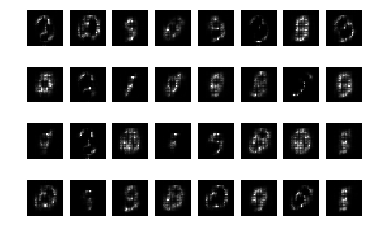

epoch =  41


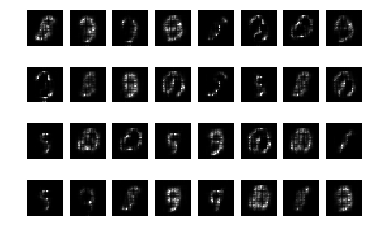

epoch =  42


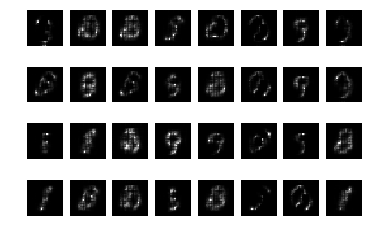

epoch =  43


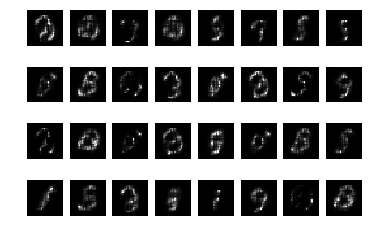

epoch =  44


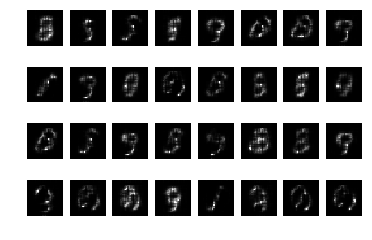

epoch =  45


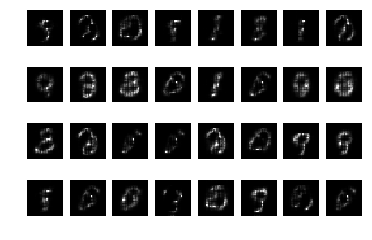

epoch =  46


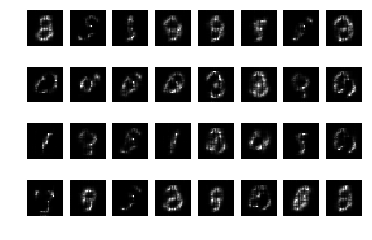

epoch =  47


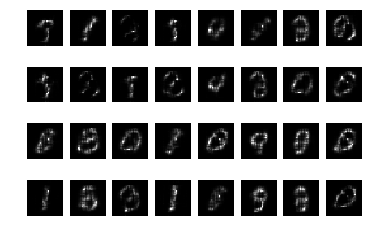

epoch =  48


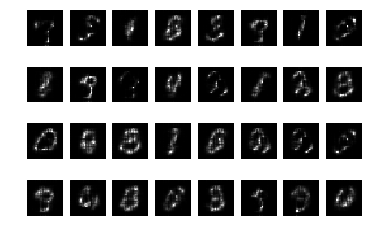

epoch =  49


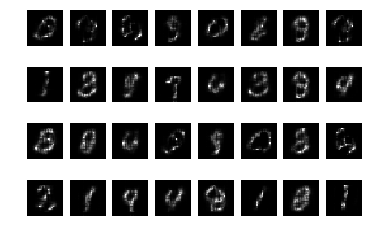

epoch =  50


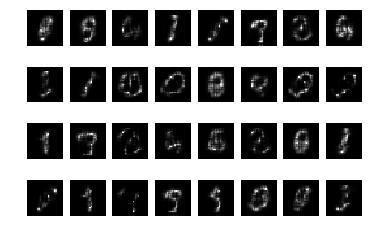

epoch =  51


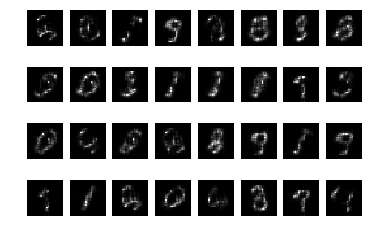

epoch =  52


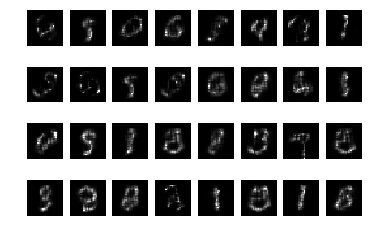

epoch =  53


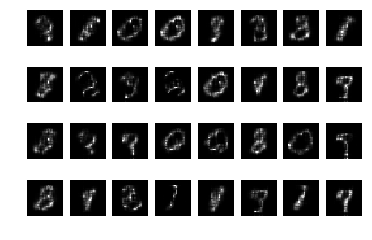

epoch =  54


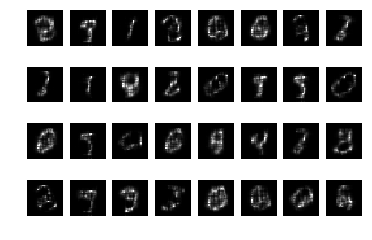

epoch =  55


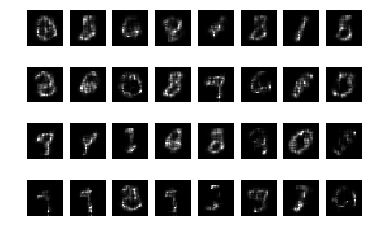

epoch =  56


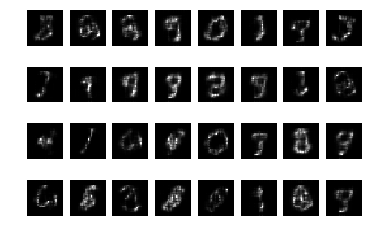

epoch =  57


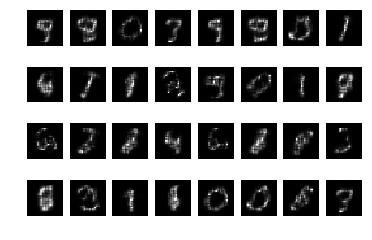

epoch =  58


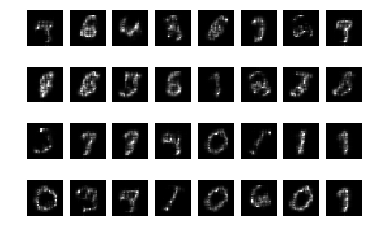

epoch =  59


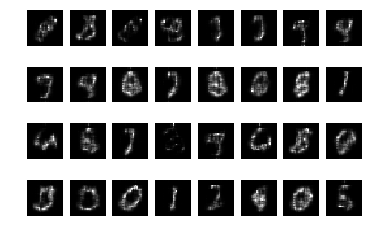

epoch =  60


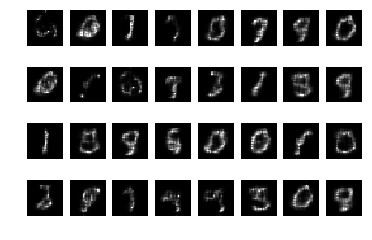

epoch =  61


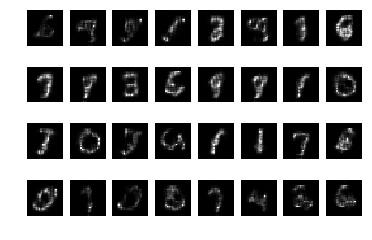

epoch =  62


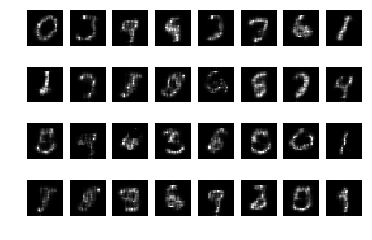

epoch =  63


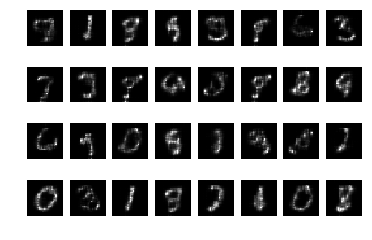

epoch =  64


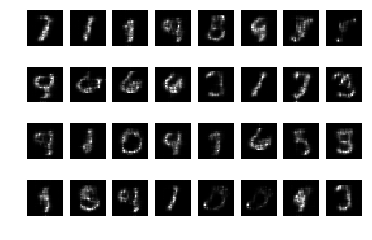

epoch =  65


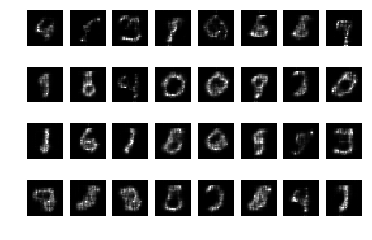

epoch =  66


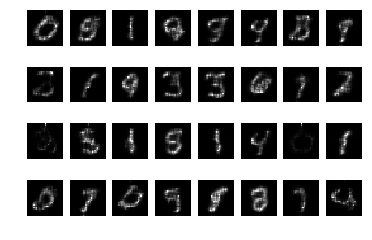

epoch =  67


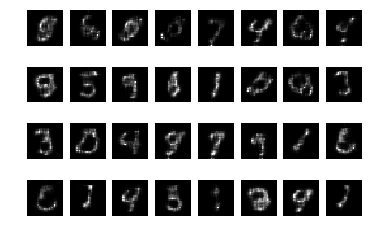

epoch =  68


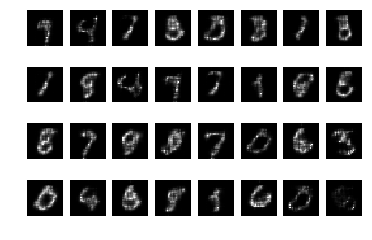

epoch =  69


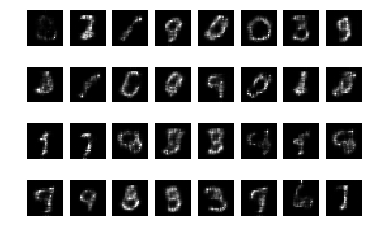

epoch =  70


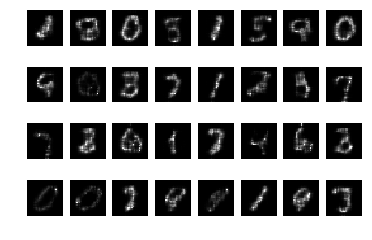

epoch =  71


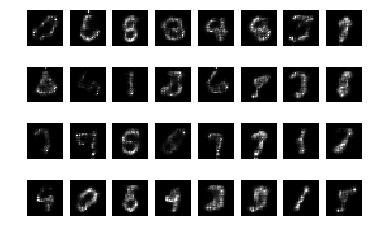

epoch =  72


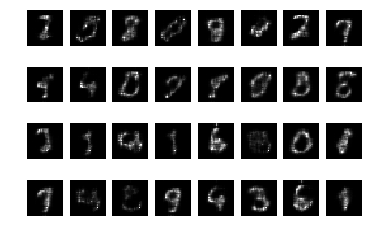

epoch =  73


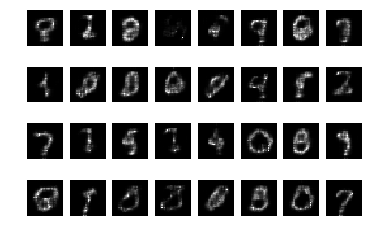

epoch =  74


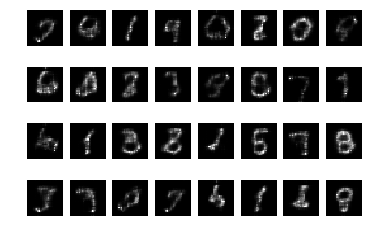

epoch =  75


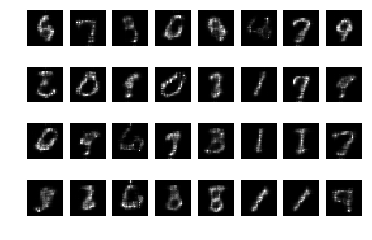

epoch =  76


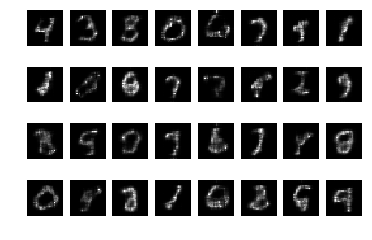

epoch =  77


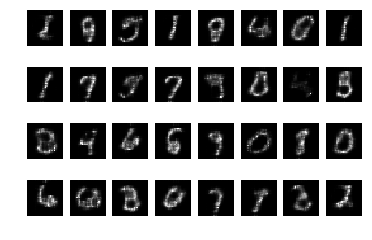

epoch =  78


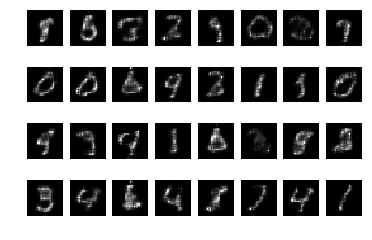

epoch =  79


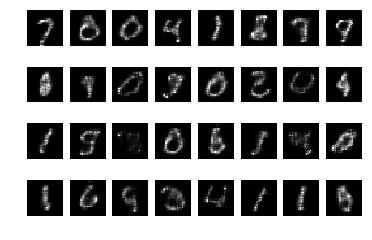

epoch =  80


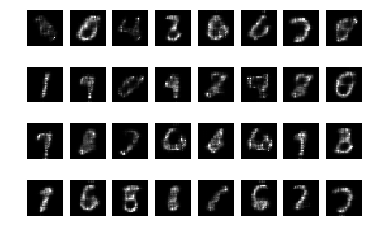

epoch =  81


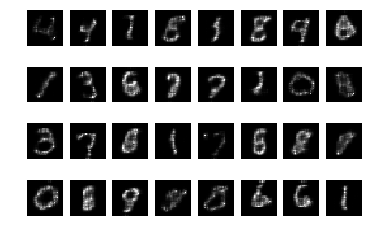

epoch =  82


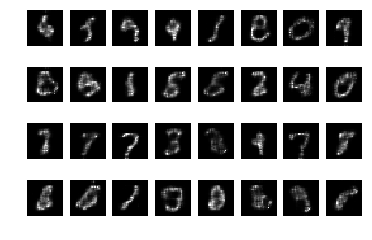

epoch =  83


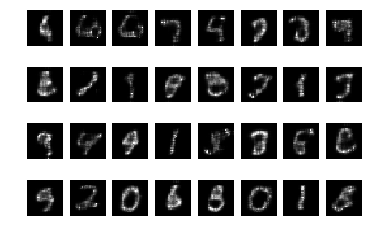

epoch =  84


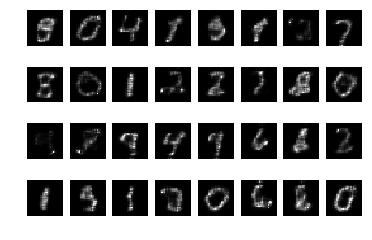

epoch =  85


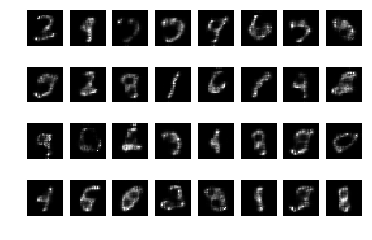

epoch =  86


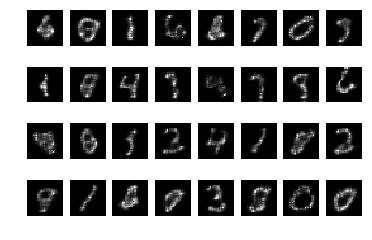

epoch =  87


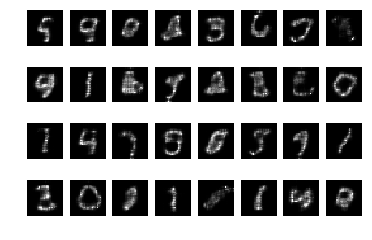

epoch =  88


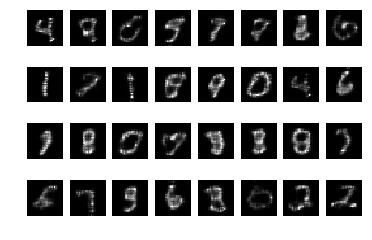

epoch =  89


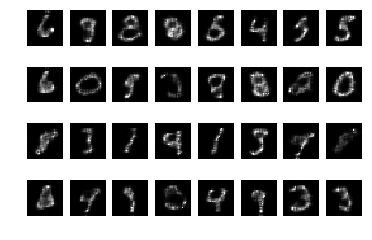

epoch =  90


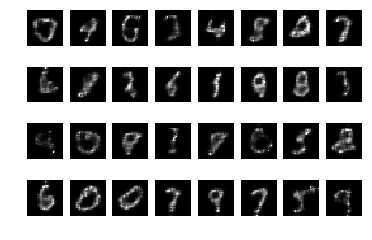

epoch =  91


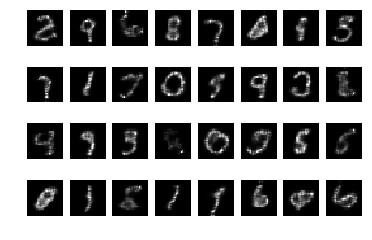

epoch =  92


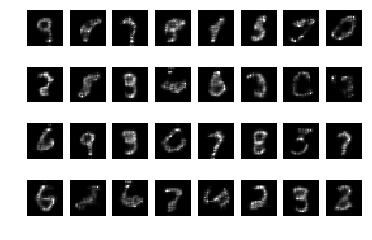

epoch =  93


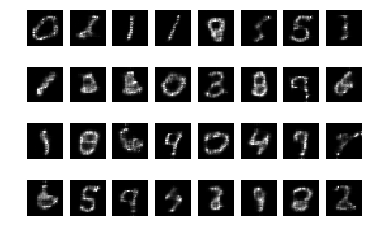

epoch =  94


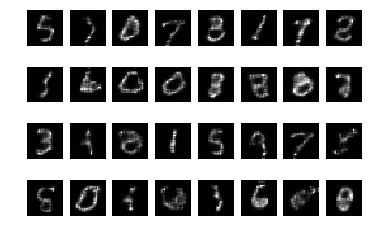

epoch =  95


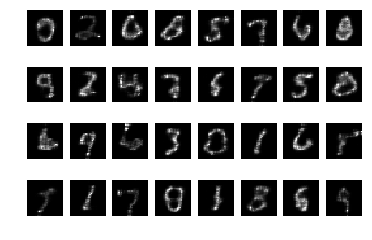

epoch =  96


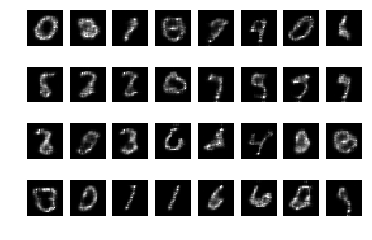

epoch =  97


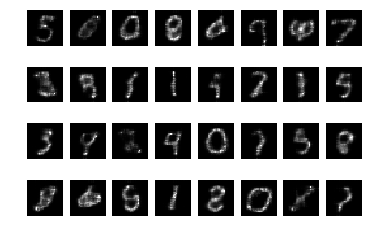

epoch =  98


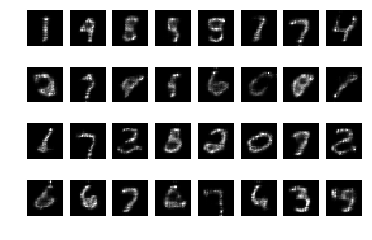

epoch =  99


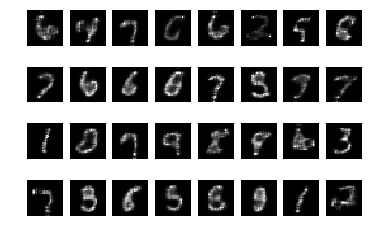

epoch =  100


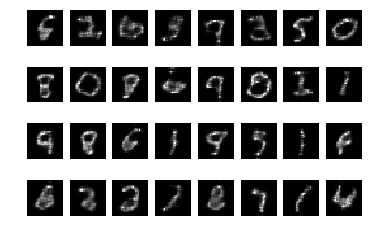

epoch =  101


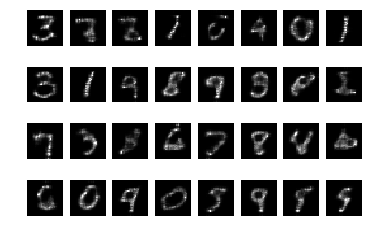

epoch =  102


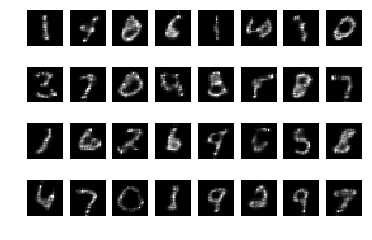

epoch =  103


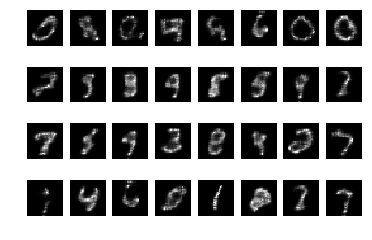

epoch =  104


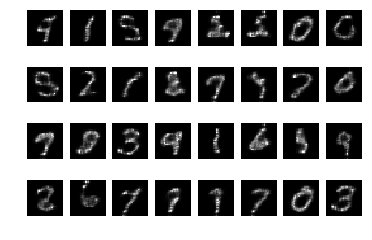

epoch =  105


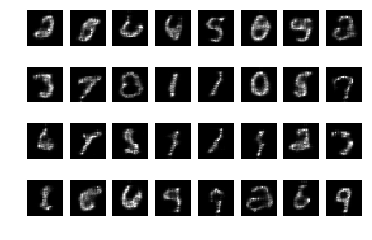

epoch =  106


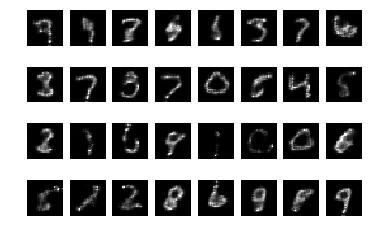

epoch =  107


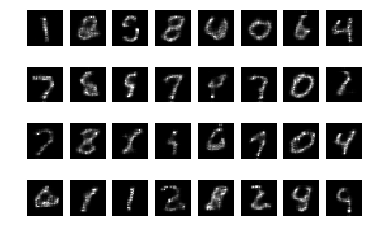

epoch =  108


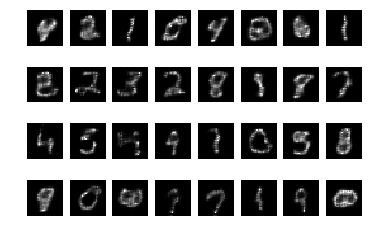

epoch =  109


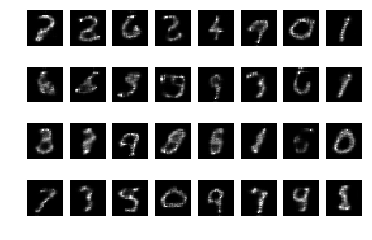

epoch =  110


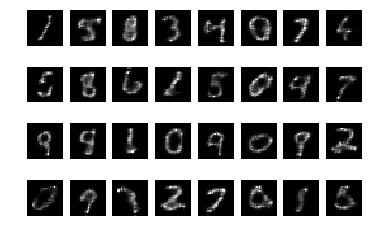

epoch =  111


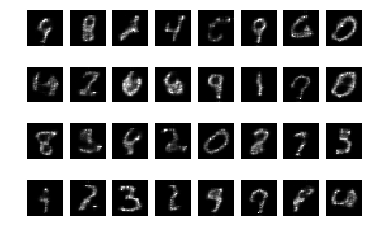

epoch =  112


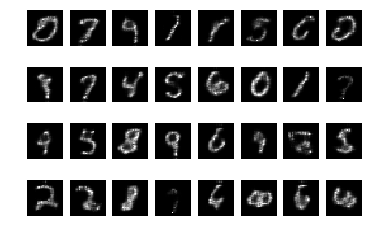

epoch =  113


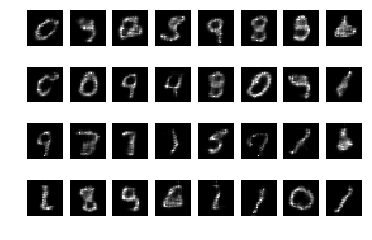

epoch =  114


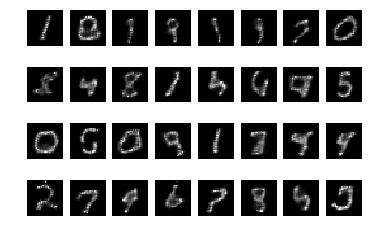

epoch =  115


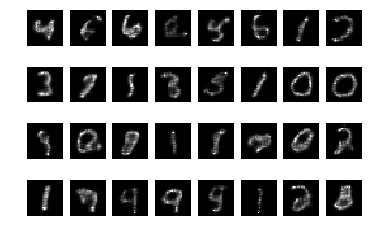

epoch =  116


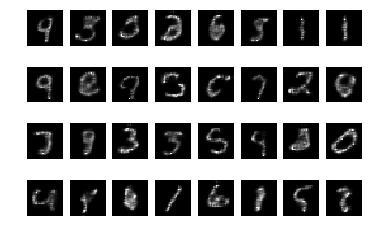

epoch =  117


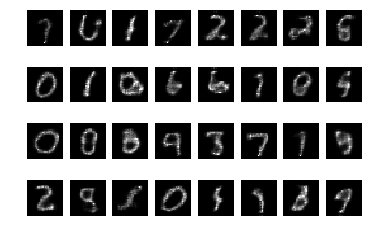

epoch =  118


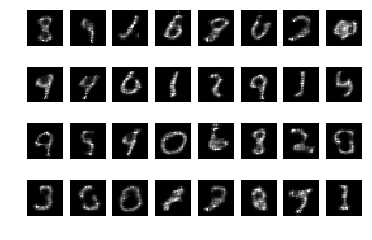

epoch =  119


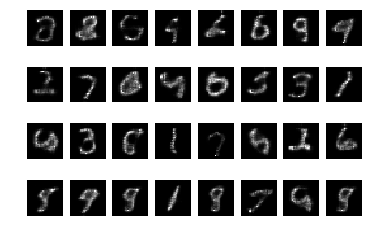

epoch =  120


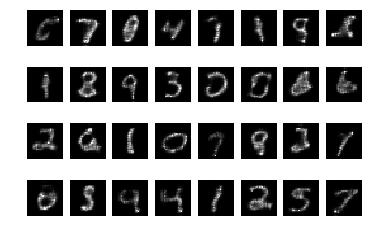

epoch =  121


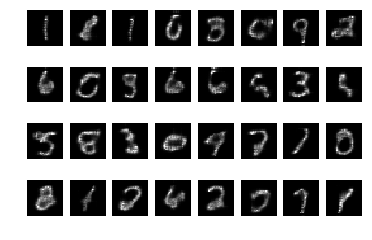

epoch =  122


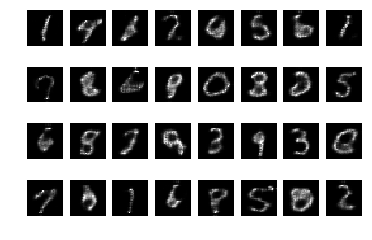

epoch =  123


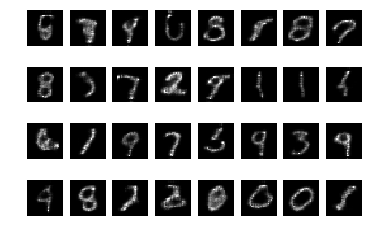

epoch =  124


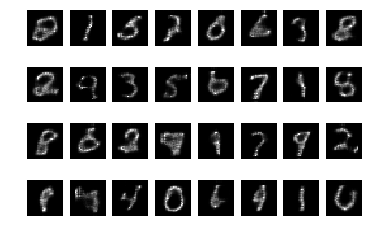

epoch =  125


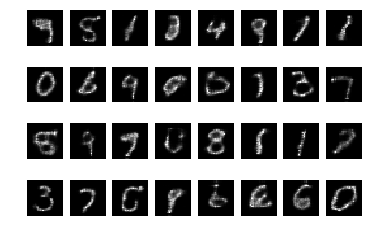

epoch =  126


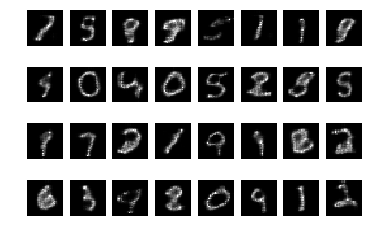

epoch =  127


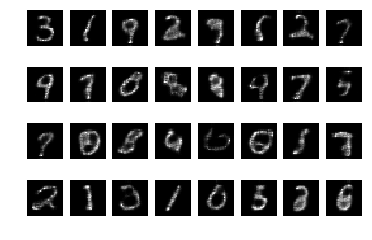

epoch =  128


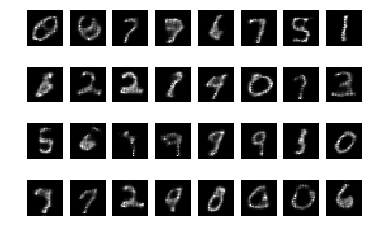

epoch =  129


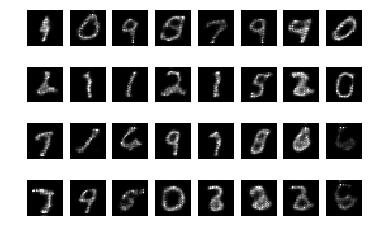

epoch =  130


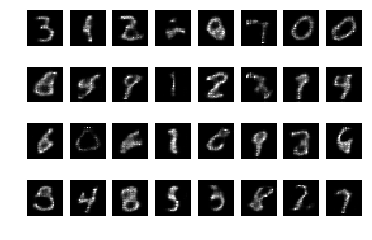

epoch =  131


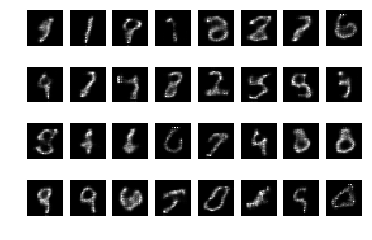

epoch =  132


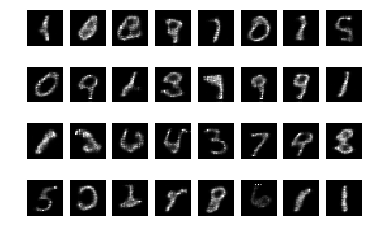

epoch =  133


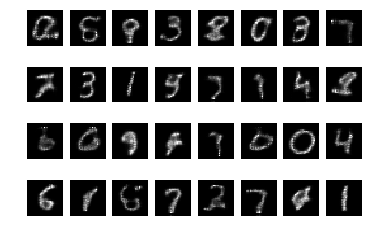

epoch =  134


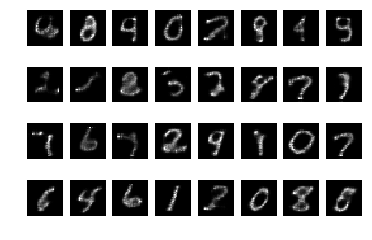

epoch =  135


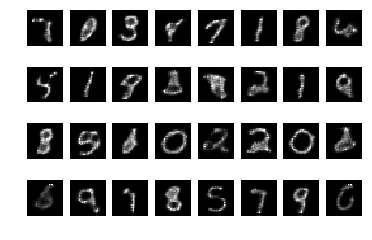

epoch =  136


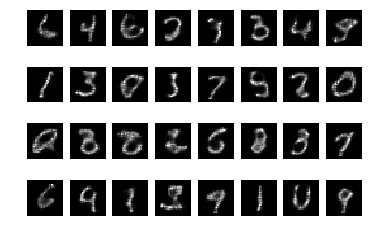

epoch =  137


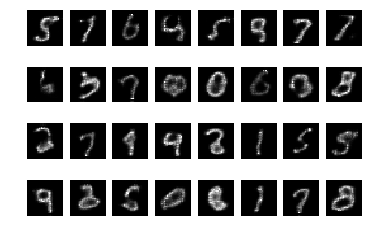

epoch =  138


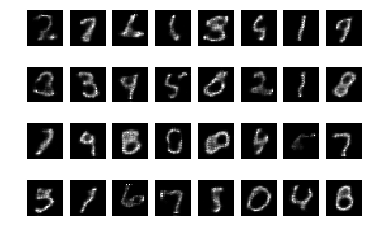

epoch =  139


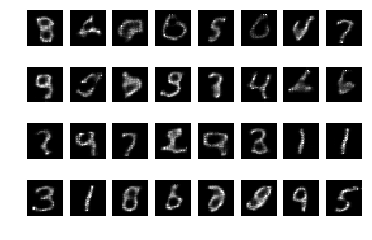

epoch =  140


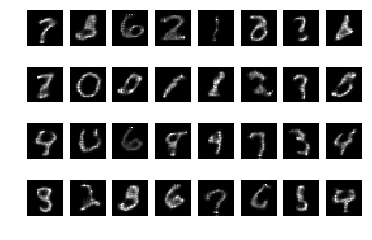

epoch =  141


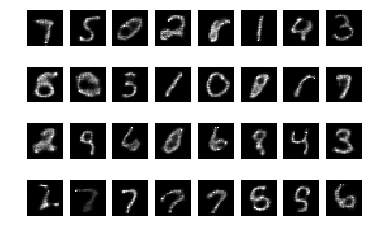

epoch =  142


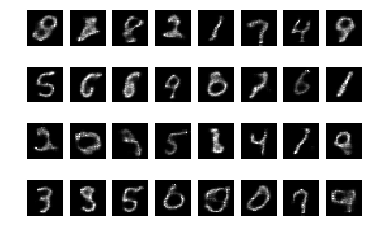

epoch =  143


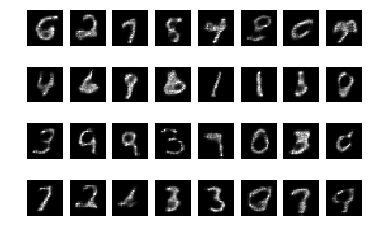

epoch =  144


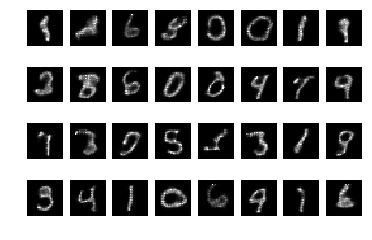

epoch =  145


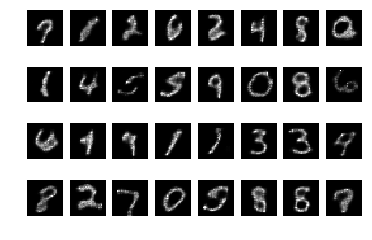

epoch =  146


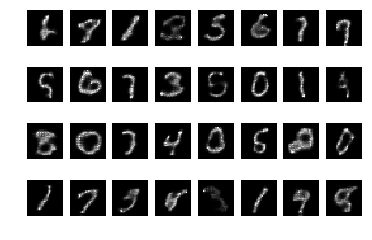

epoch =  147


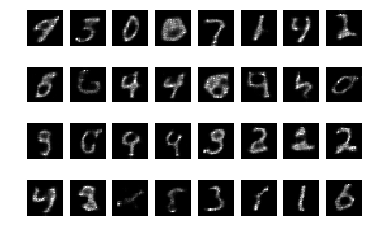

epoch =  148


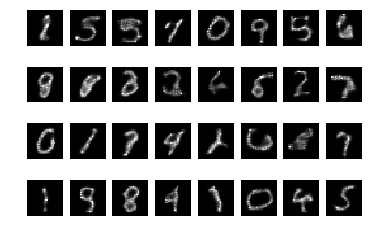

epoch =  149


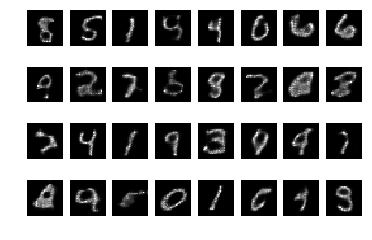

epoch =  150


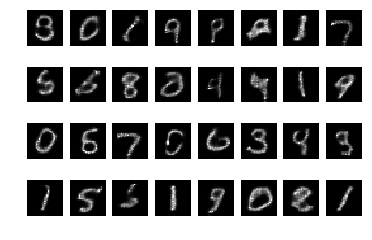

epoch =  151


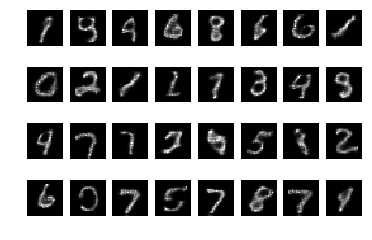

epoch =  152


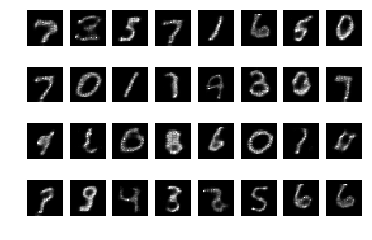

epoch =  153


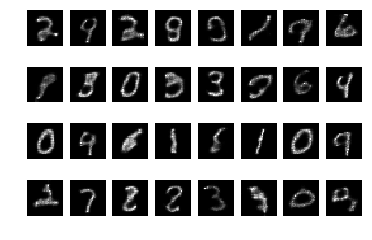

epoch =  154


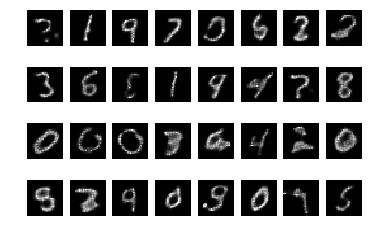

epoch =  155


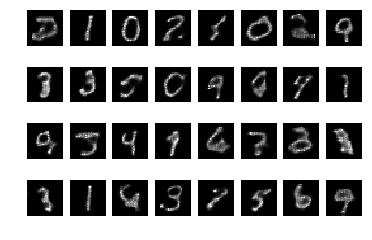

epoch =  156


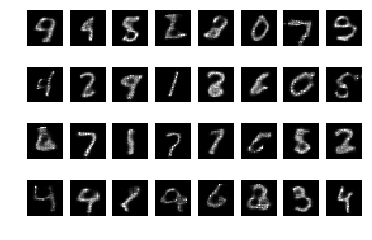

epoch =  157


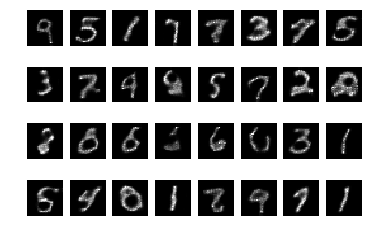

epoch =  158


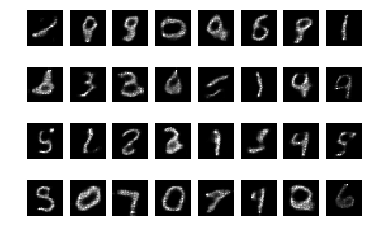

epoch =  159


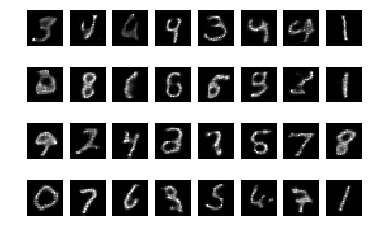

epoch =  160


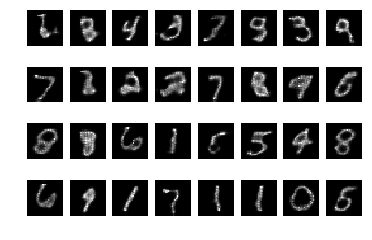

epoch =  161


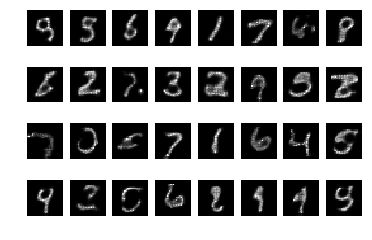

epoch =  162


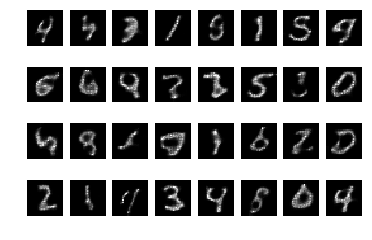

epoch =  163


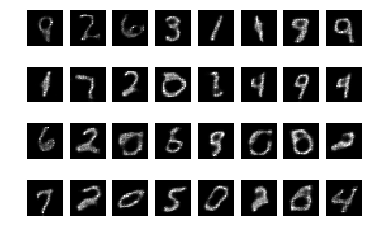

epoch =  164


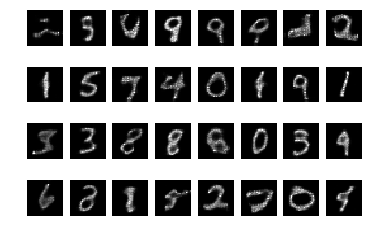

epoch =  165


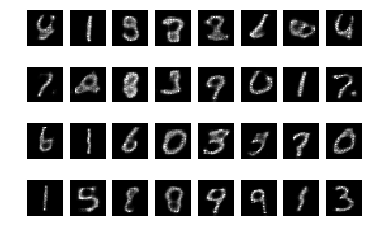

epoch =  166


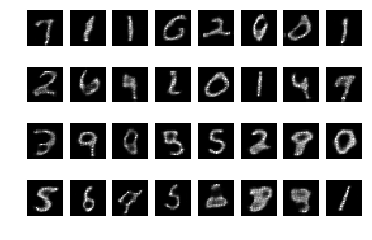

epoch =  167


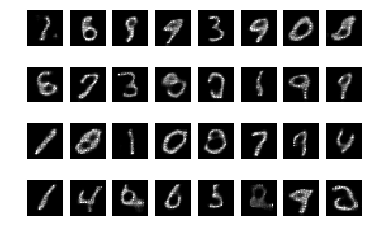

epoch =  168


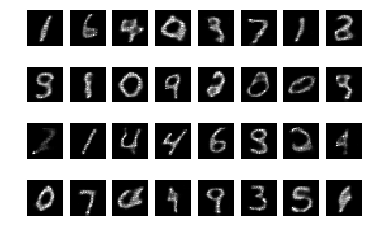

epoch =  169


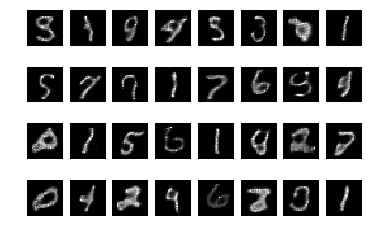

epoch =  170


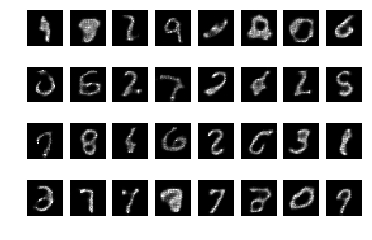

epoch =  171


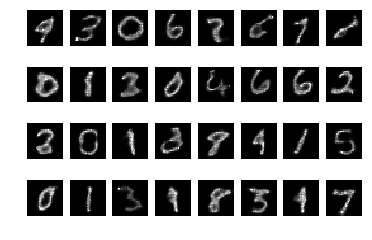

epoch =  172


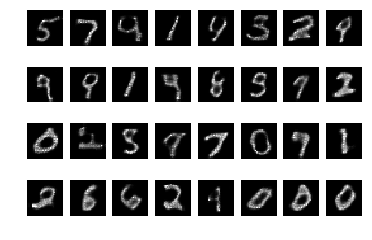

epoch =  173


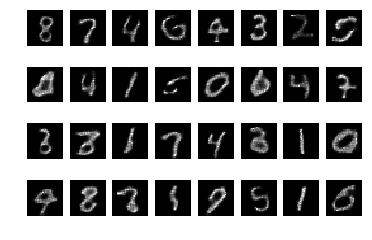

epoch =  174


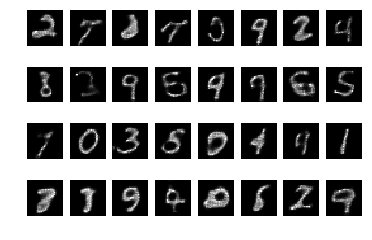

epoch =  175


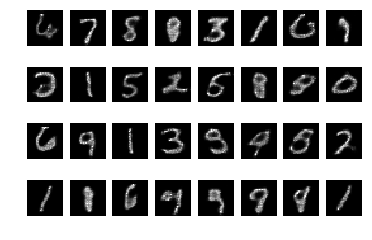

epoch =  176


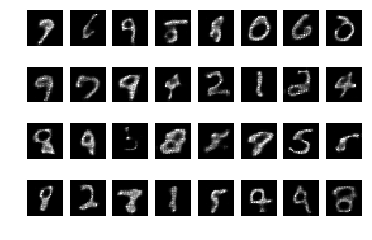

epoch =  177


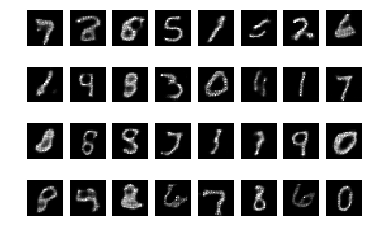

epoch =  178


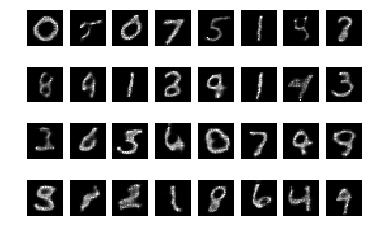

epoch =  179


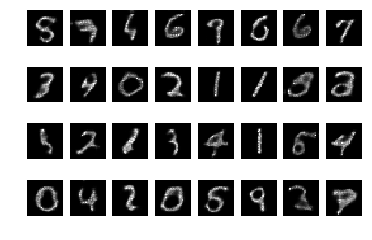

epoch =  180


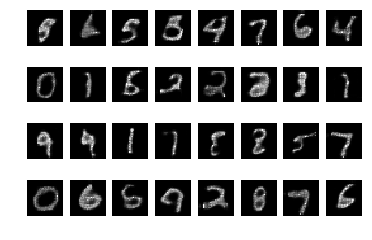

epoch =  181


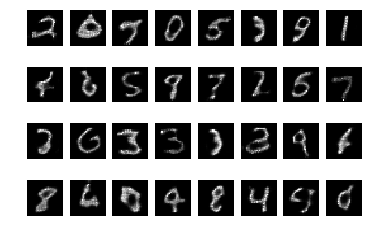

epoch =  182


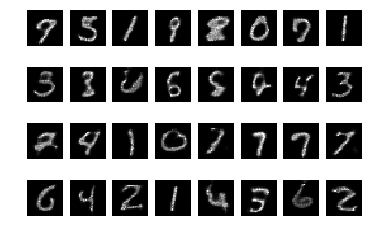

epoch =  183


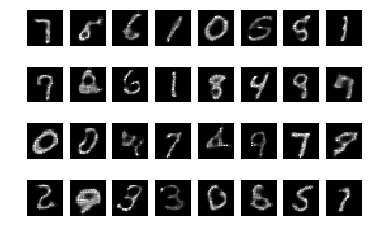

epoch =  184


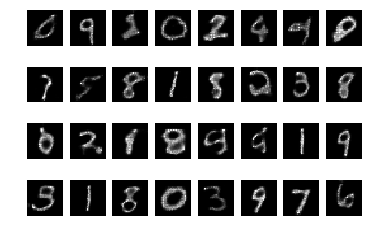

epoch =  185


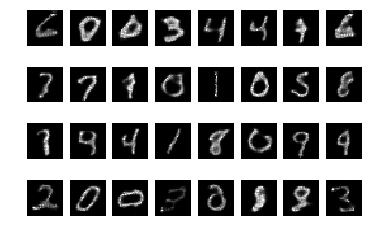

epoch =  186


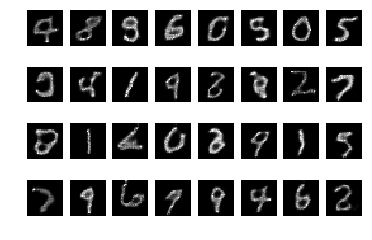

epoch =  187


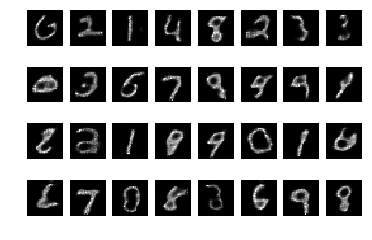

epoch =  188


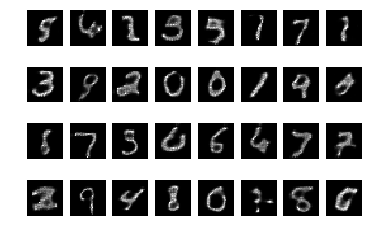

epoch =  189


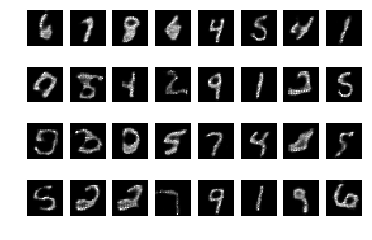

epoch =  190


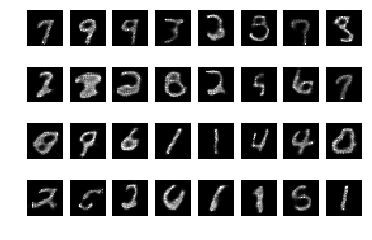

epoch =  191


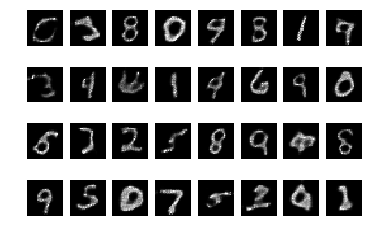

epoch =  192


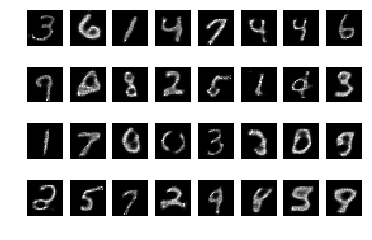

epoch =  193


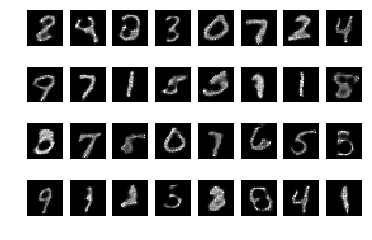

epoch =  194


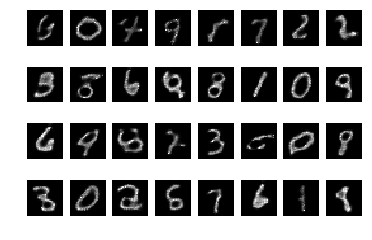

epoch =  195


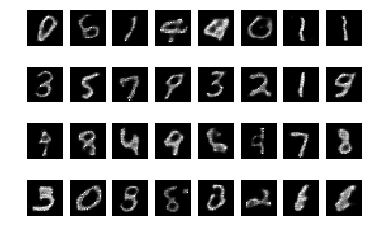

epoch =  196


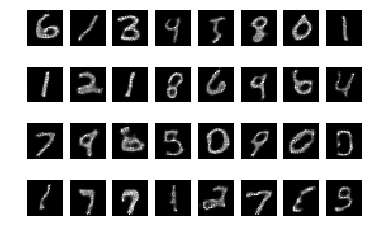

epoch =  197


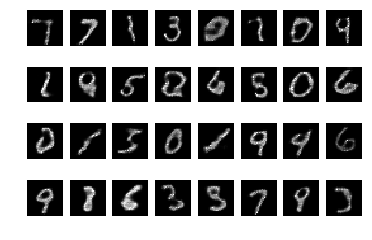

epoch =  198


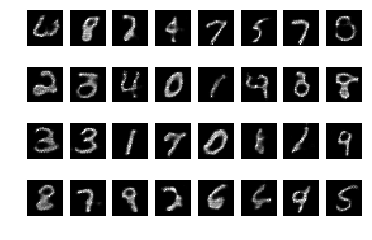

epoch =  199


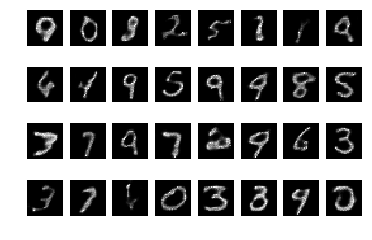

epoch =  200


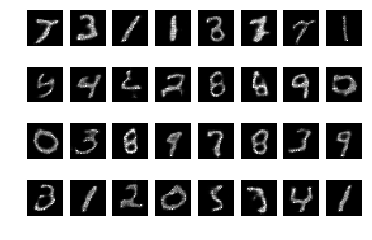

epoch =  201


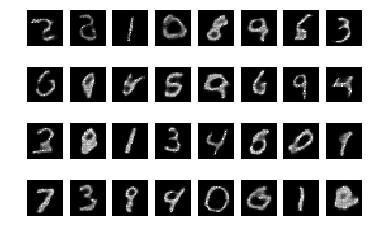

epoch =  202


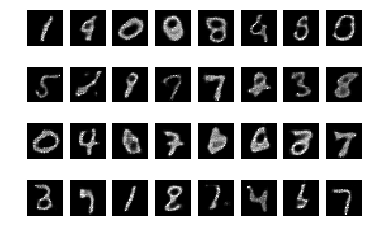

epoch =  203


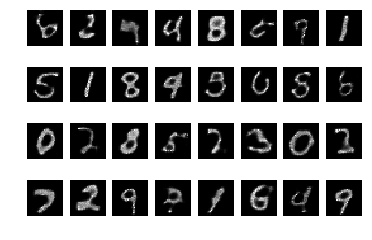

epoch =  204


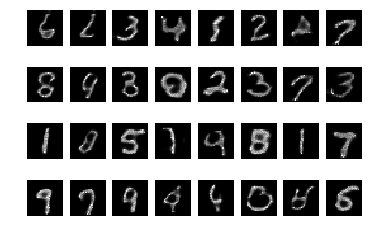

epoch =  205


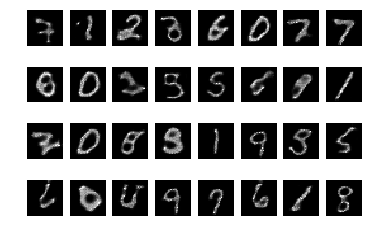

epoch =  206


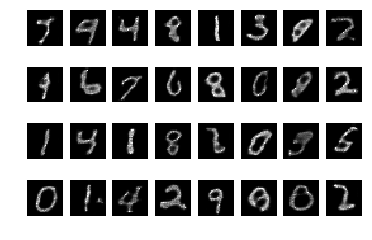

epoch =  207


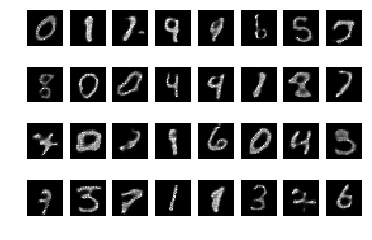

epoch =  208


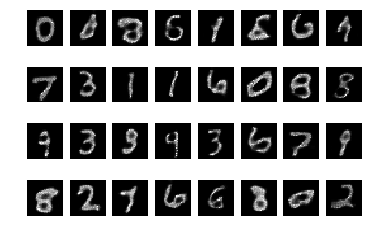

epoch =  209


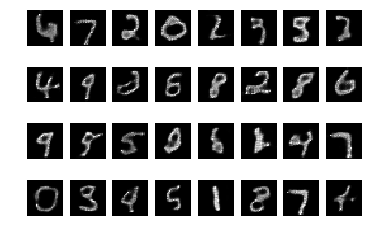

epoch =  210


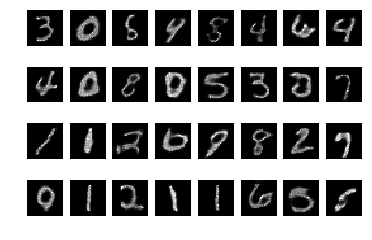

epoch =  211


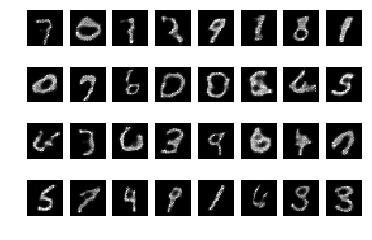

epoch =  212


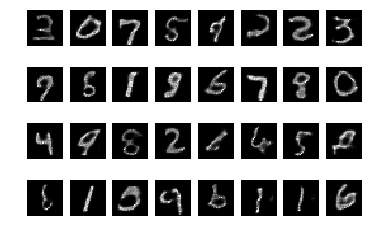

epoch =  213


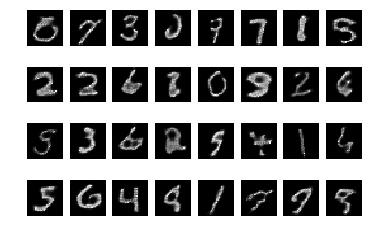

epoch =  214


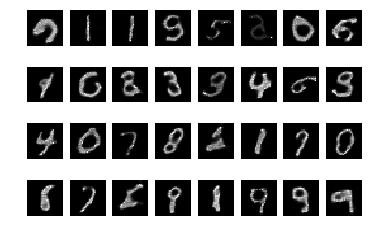

epoch =  215


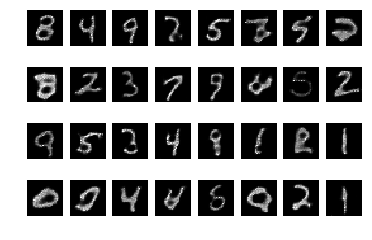

epoch =  216


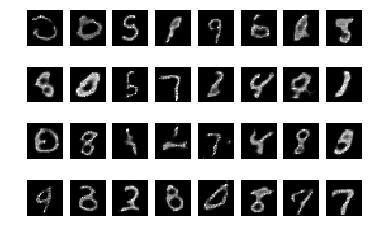

epoch =  217


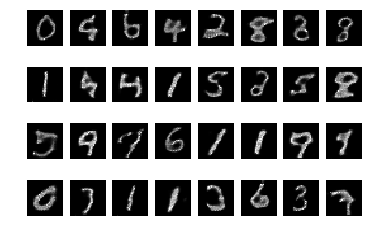

epoch =  218


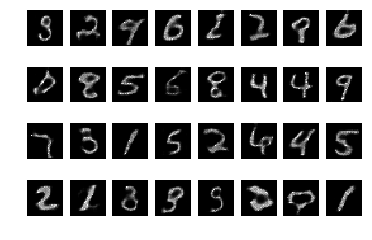

epoch =  219


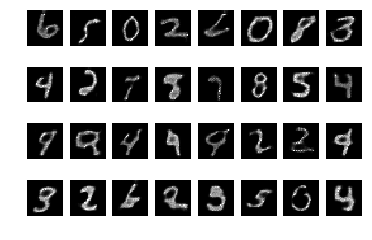

epoch =  220


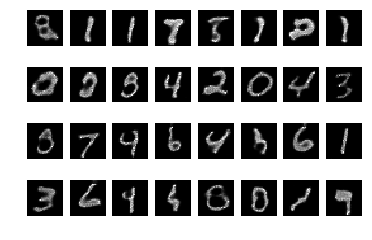

epoch =  221


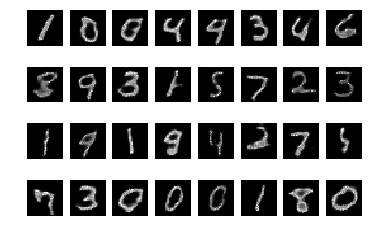

epoch =  222


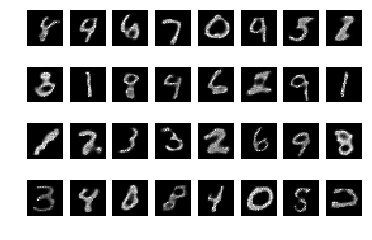

epoch =  223


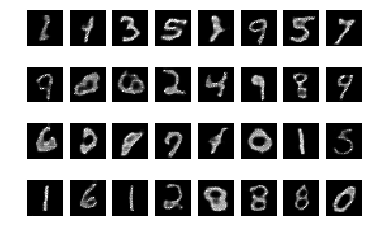

epoch =  224


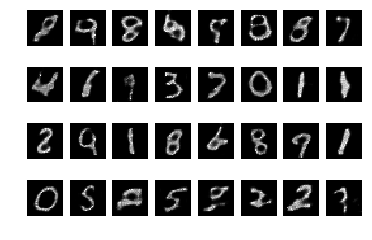

epoch =  225


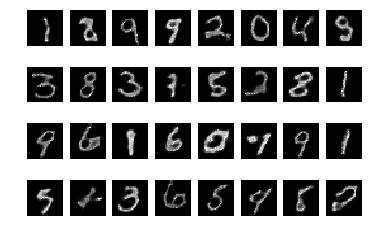

epoch =  226


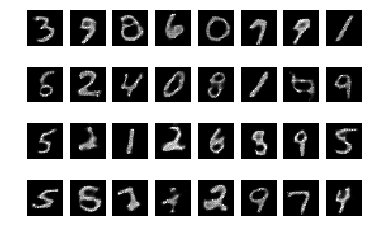

epoch =  227


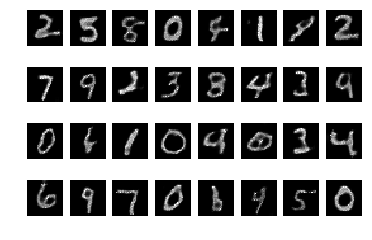

epoch =  228


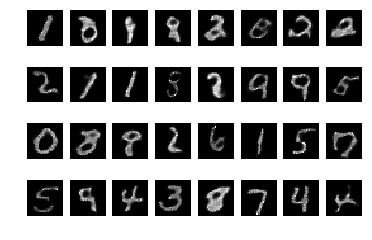

epoch =  229


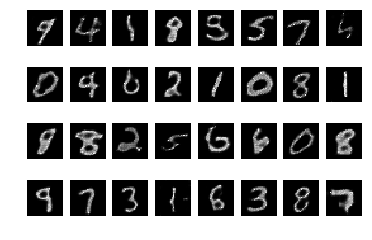

epoch =  230


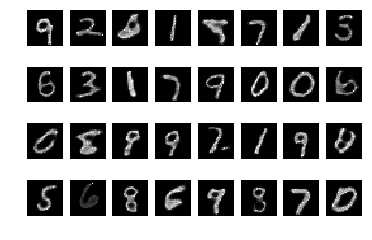

epoch =  231


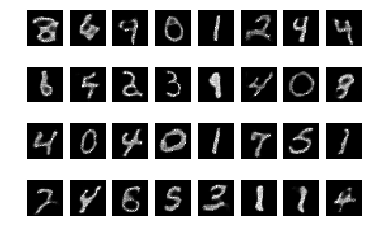

epoch =  232


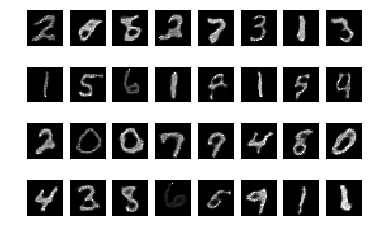

epoch =  233


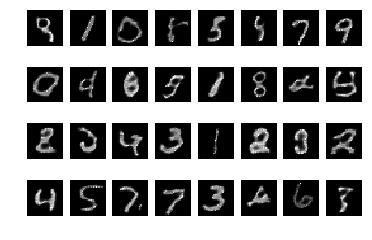

epoch =  234


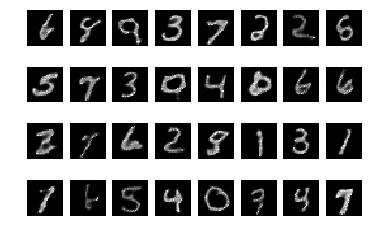

epoch =  235


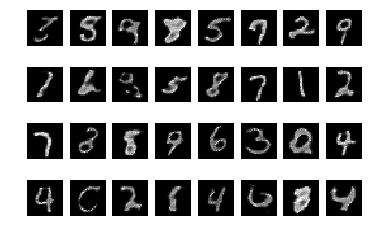

epoch =  236


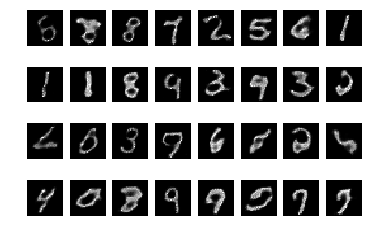

epoch =  237


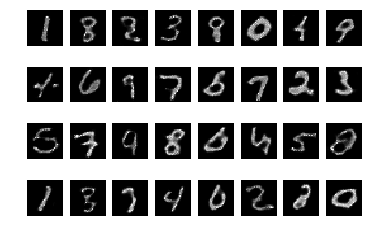

epoch =  238


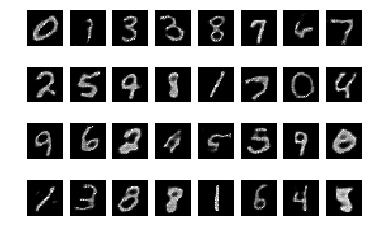

epoch =  239


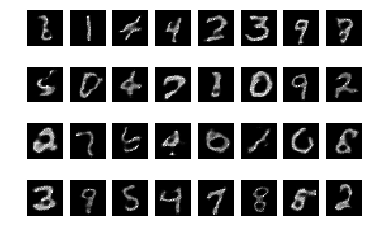

epoch =  240


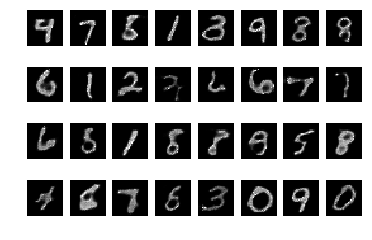

epoch =  241


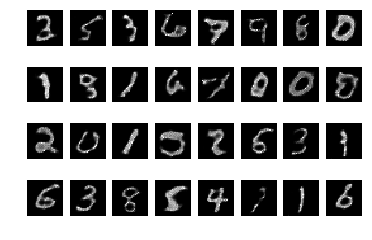

epoch =  242


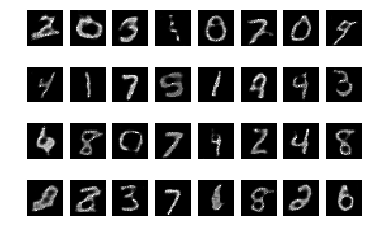

epoch =  243


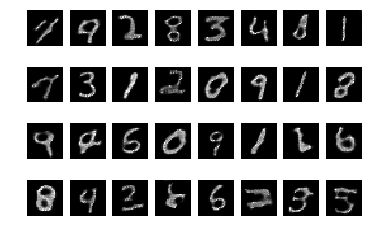

epoch =  244


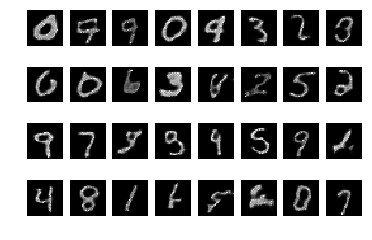

epoch =  245


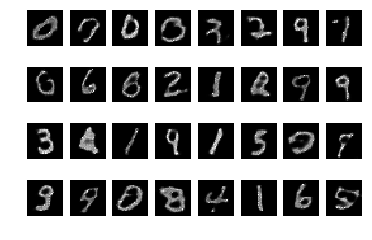

epoch =  246


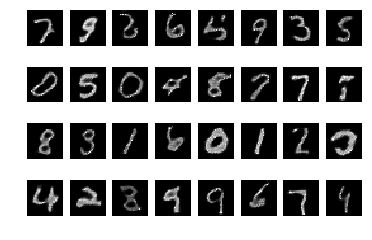

epoch =  247


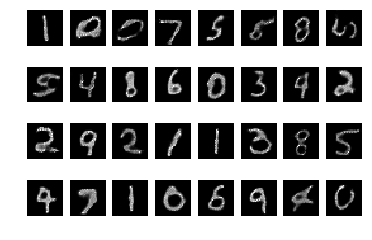

epoch =  248


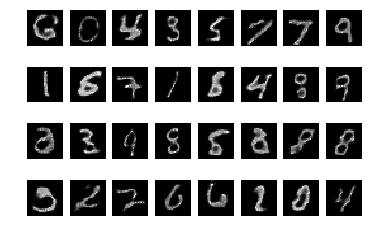

epoch =  249


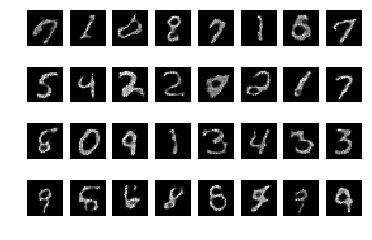

epoch =  250


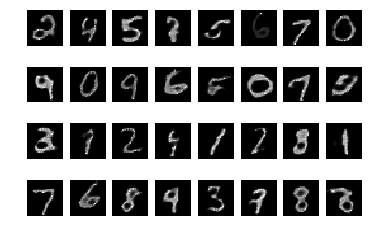

epoch =  251


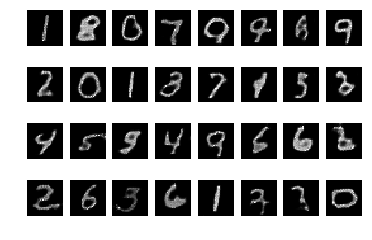

epoch =  252


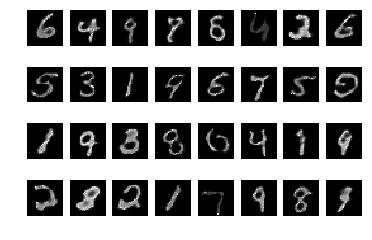

epoch =  253


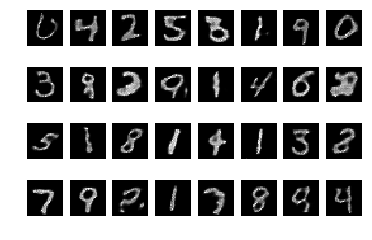

epoch =  254


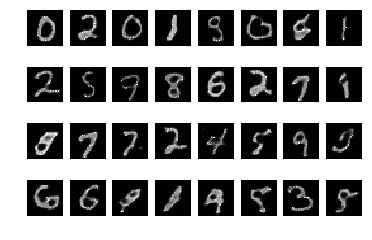

epoch =  255


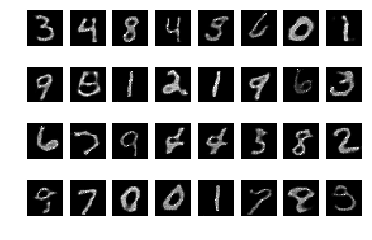

epoch =  256


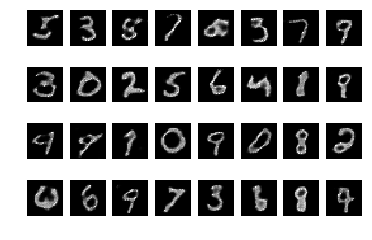

epoch =  257


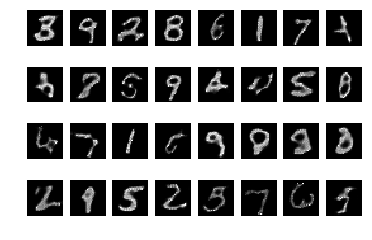

epoch =  258


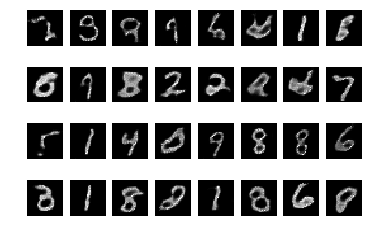

epoch =  259


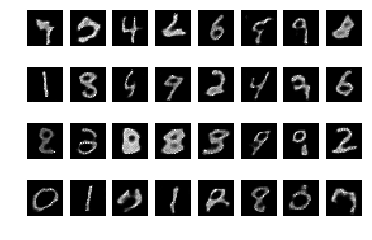

epoch =  260


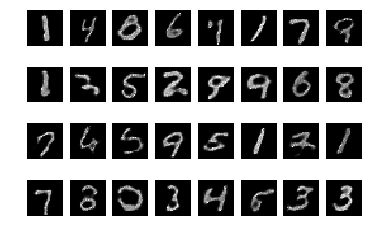

epoch =  261


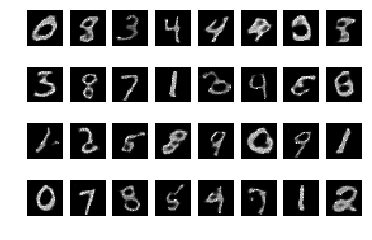

epoch =  262


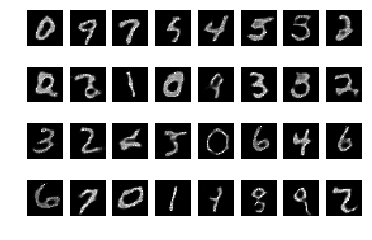

epoch =  263


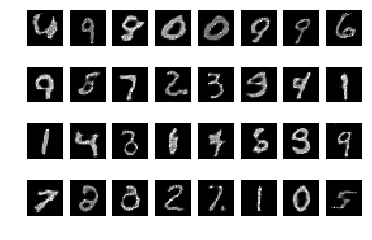

epoch =  264


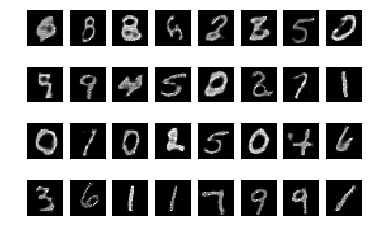

epoch =  265


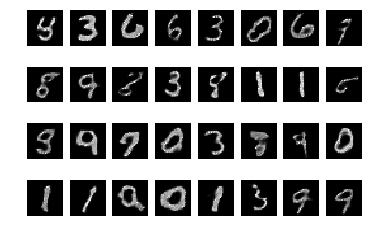

epoch =  266


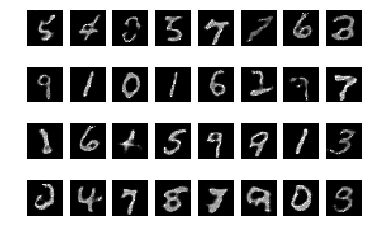

epoch =  267


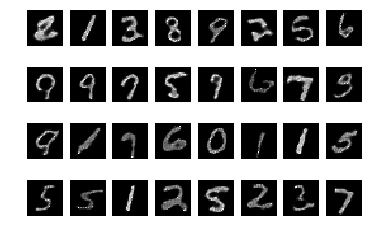

epoch =  268


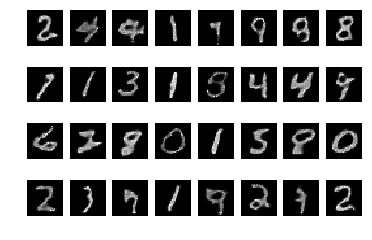

epoch =  269


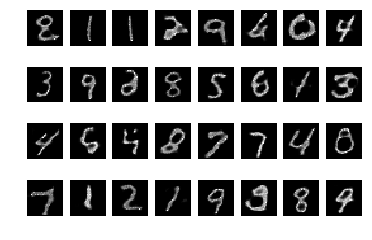

epoch =  270


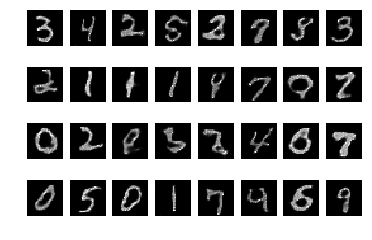

epoch =  271


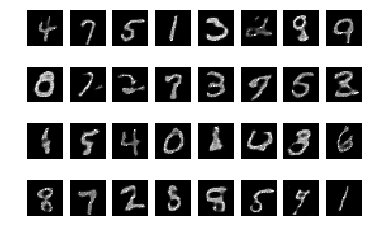

epoch =  272


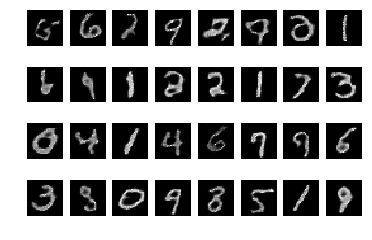

epoch =  273


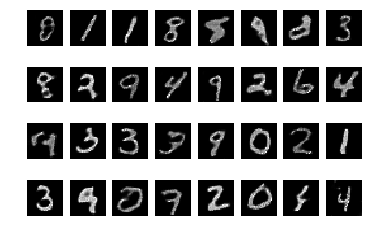

epoch =  274


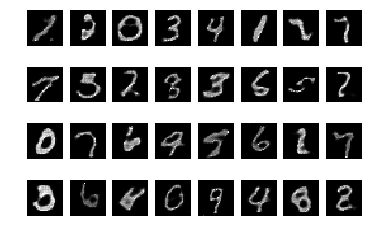

epoch =  275


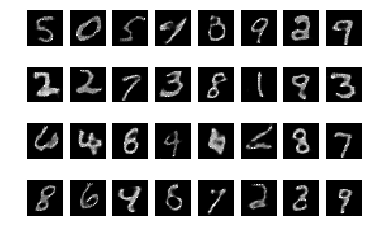

epoch =  276


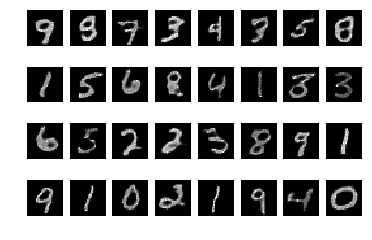

epoch =  277


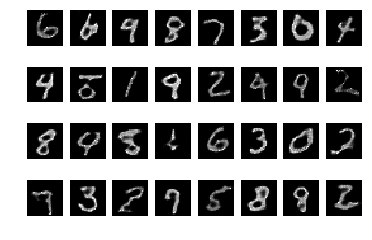

epoch =  278


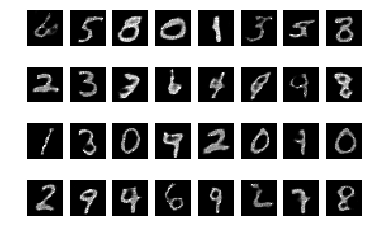

epoch =  279


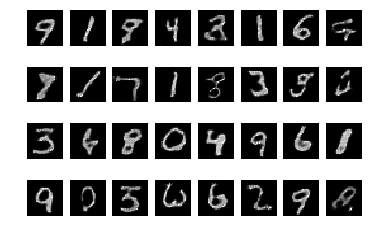

epoch =  280


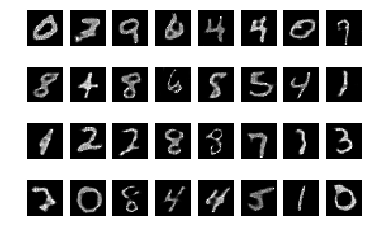

epoch =  281


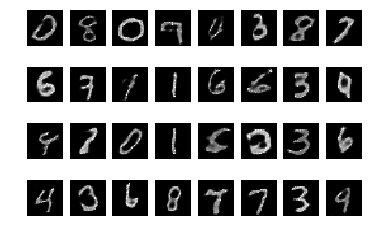

epoch =  282


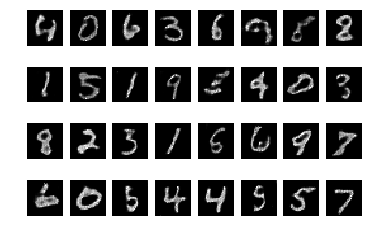

epoch =  283


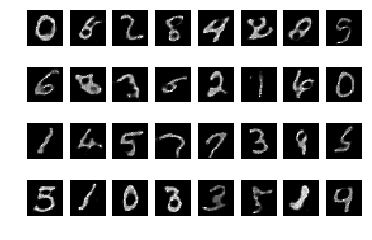

epoch =  284


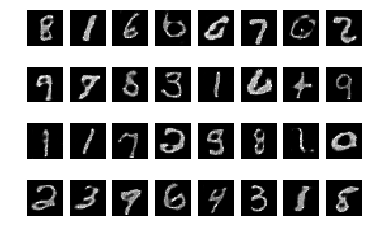

epoch =  285


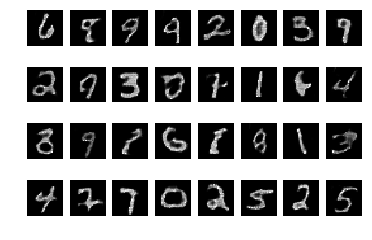

epoch =  286


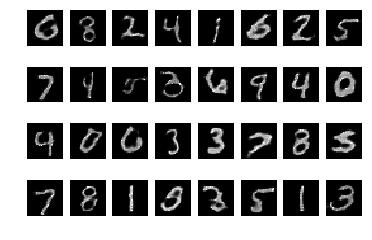

epoch =  287


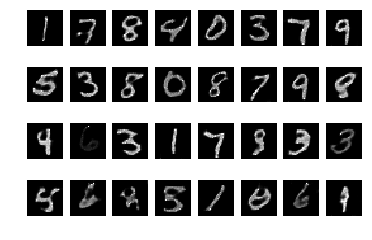

epoch =  288


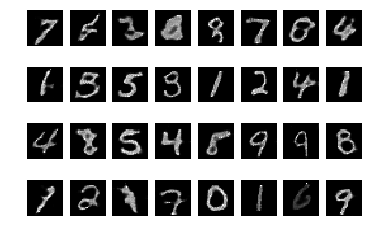

epoch =  289


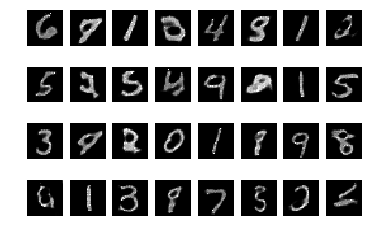

epoch =  290


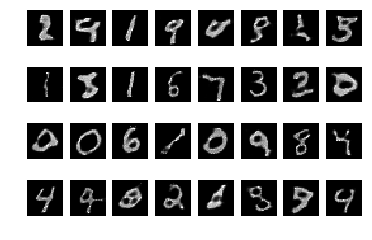

epoch =  291


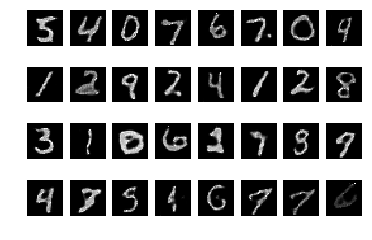

epoch =  292


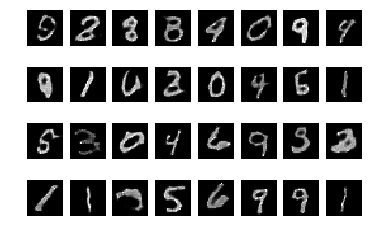

epoch =  293


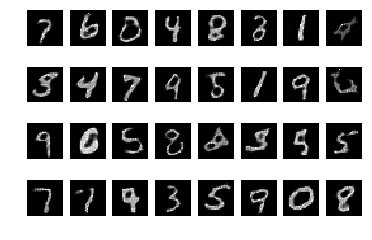

epoch =  294


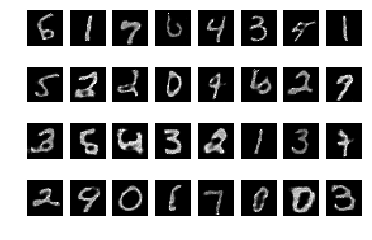

epoch =  295


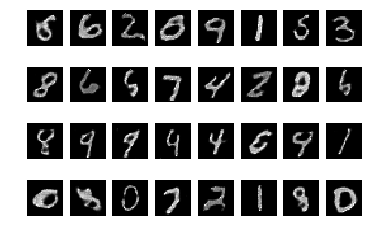

epoch =  296


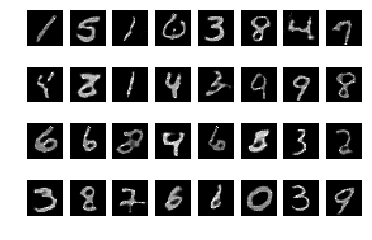

epoch =  297


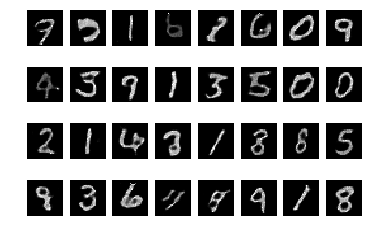

epoch =  298


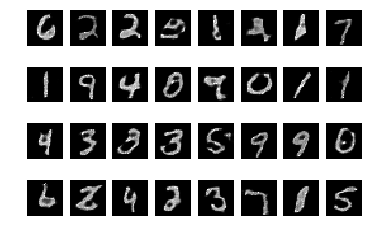

epoch =  299


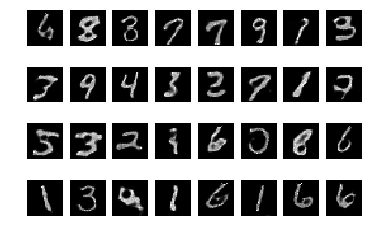

epoch =  300


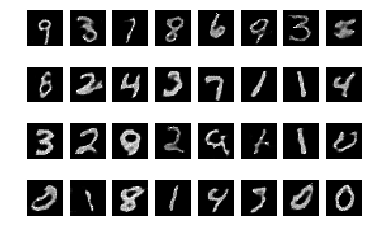

epoch =  301


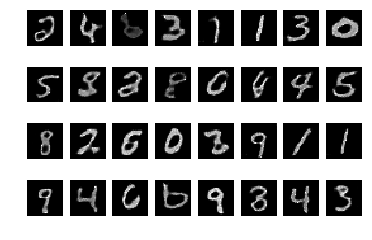

epoch =  302


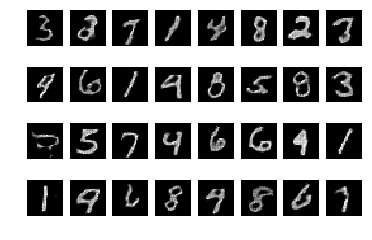

epoch =  303


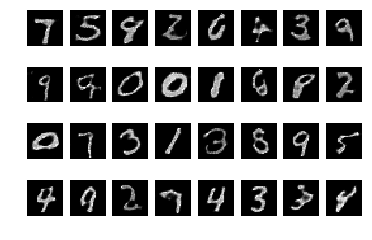

epoch =  304


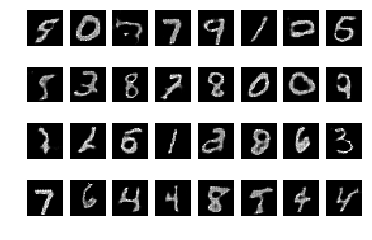

epoch =  305


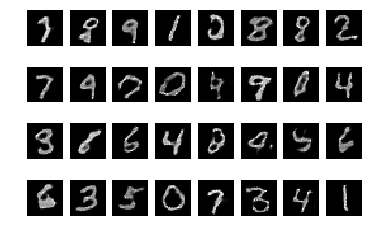

epoch =  306


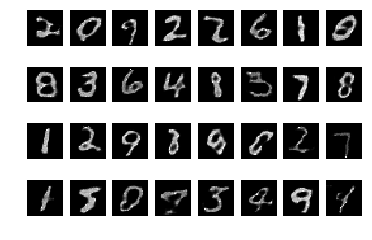

epoch =  307


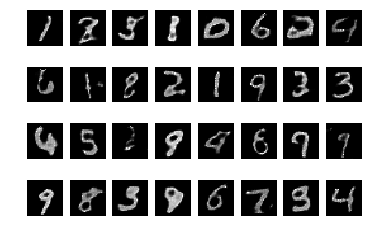

epoch =  308


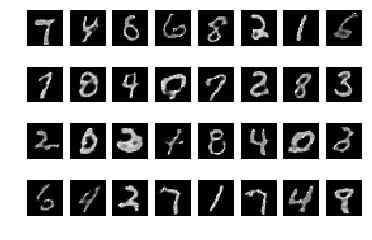

epoch =  309


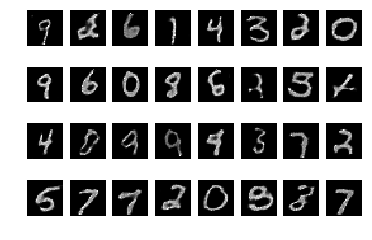

epoch =  310


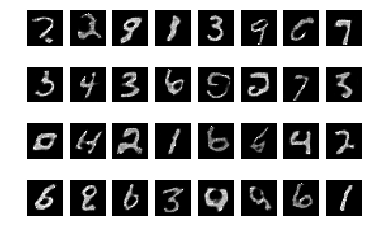

epoch =  311


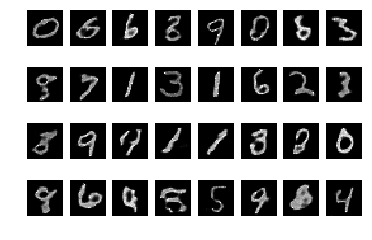

epoch =  312


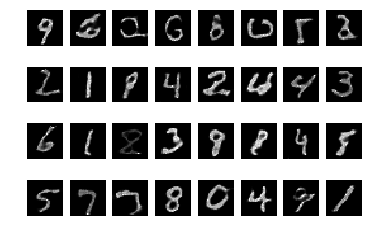

epoch =  313


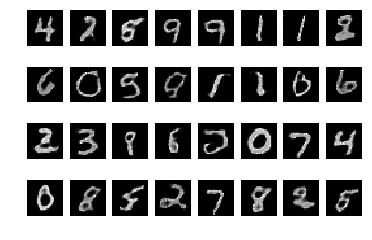

epoch =  314


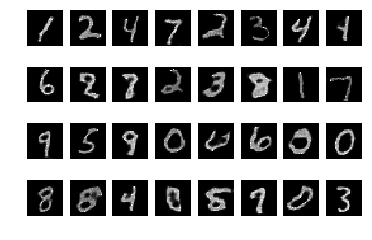

epoch =  315


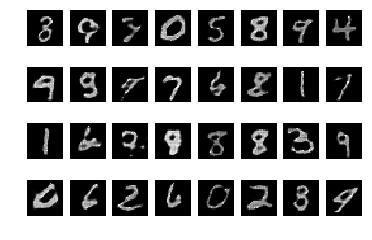

epoch =  316


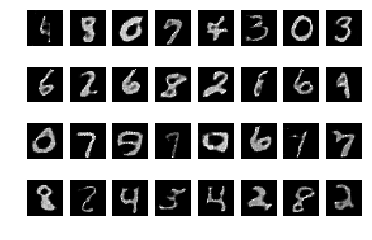

epoch =  317


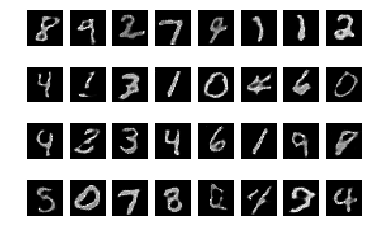

epoch =  318


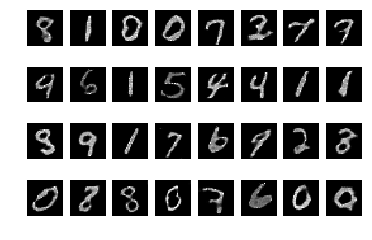

epoch =  319


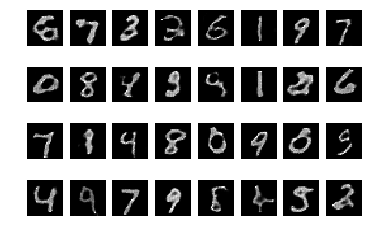

epoch =  320


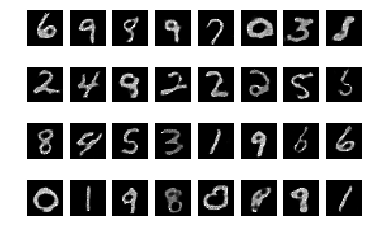

epoch =  321


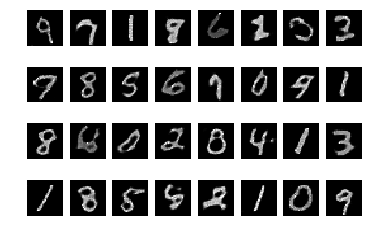

epoch =  322


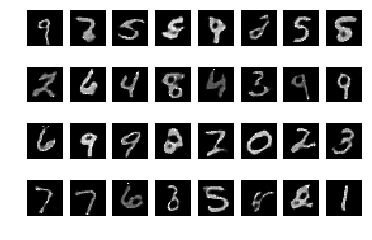

epoch =  323


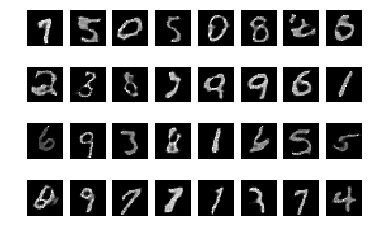

epoch =  324


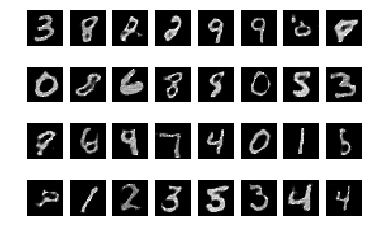

epoch =  325


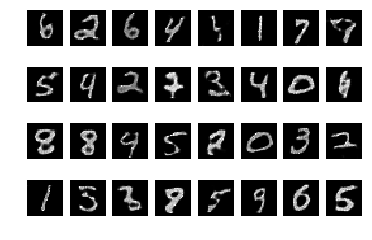

epoch =  326


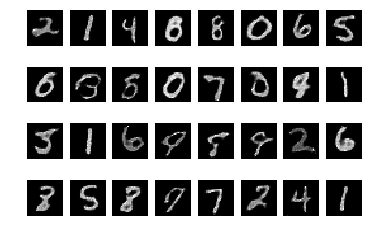

epoch =  327


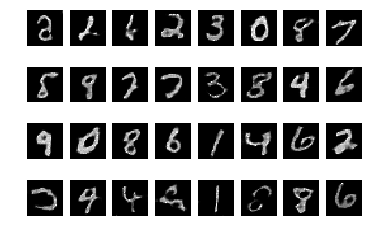

epoch =  328


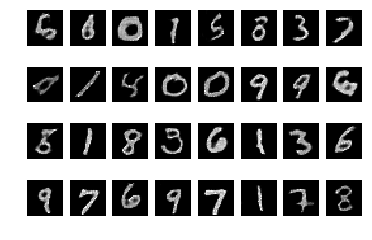

epoch =  329


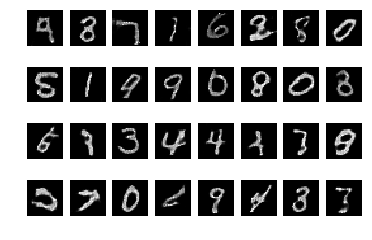

epoch =  330


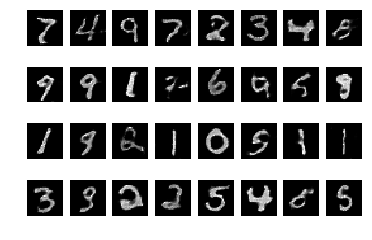

epoch =  331


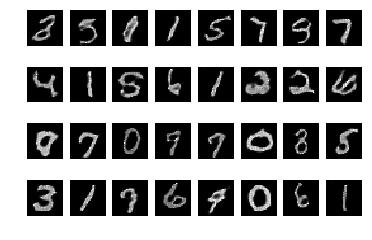

epoch =  332


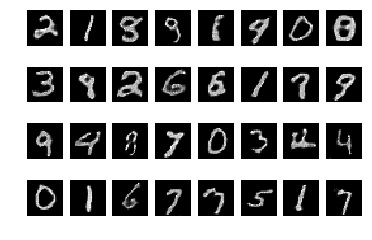

epoch =  333


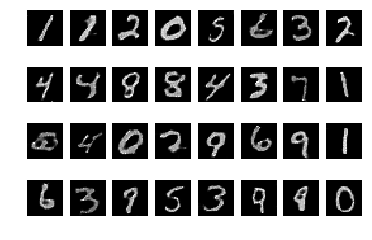

epoch =  334


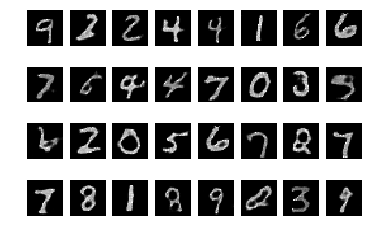

epoch =  335


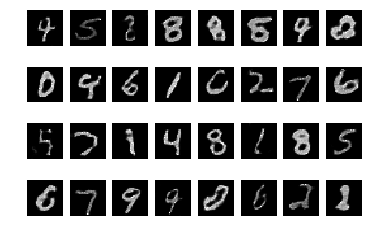

epoch =  336


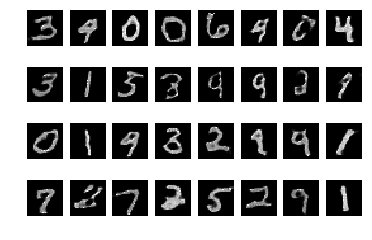

epoch =  337


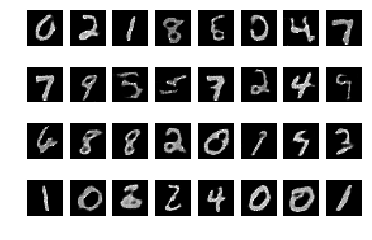

epoch =  338


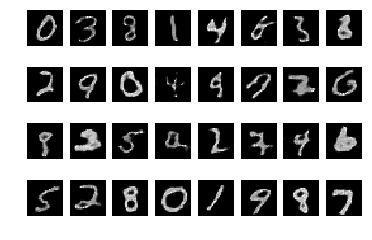

epoch =  339


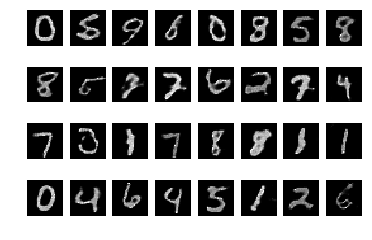

epoch =  340


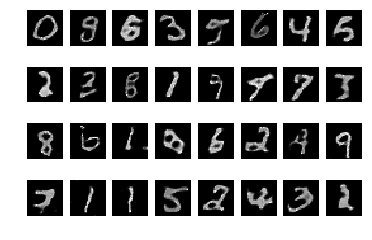

epoch =  341


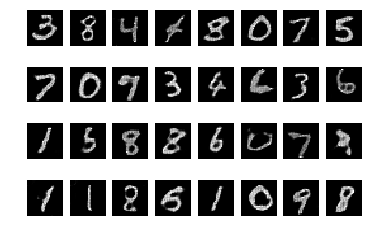

epoch =  342


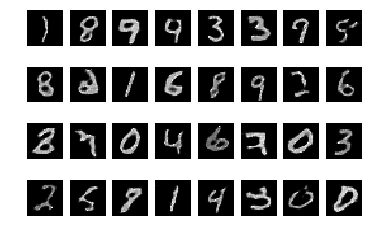

epoch =  343


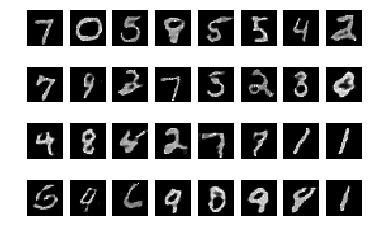

epoch =  344


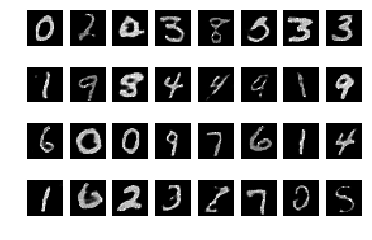

epoch =  345


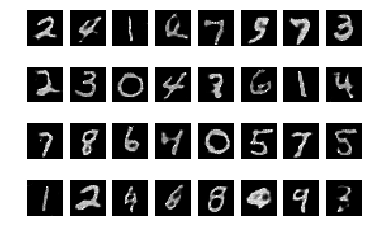

epoch =  346


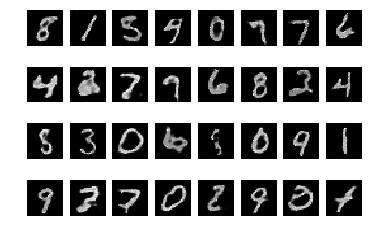

epoch =  347


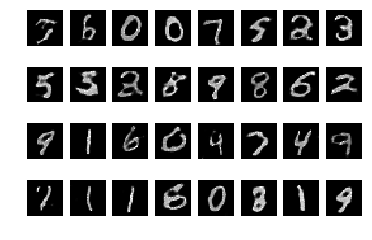

epoch =  348


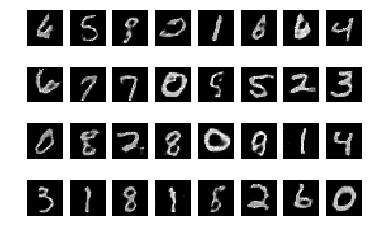

epoch =  349


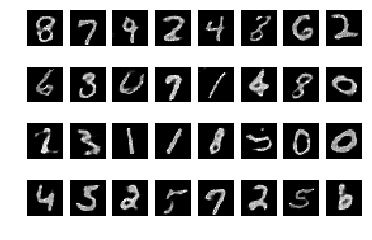

epoch =  350


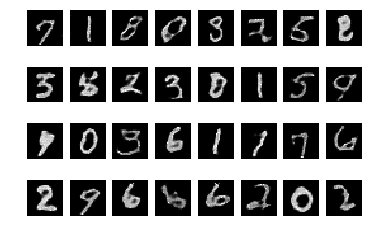

epoch =  351


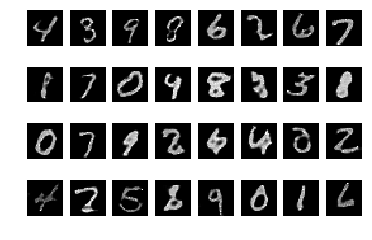

epoch =  352


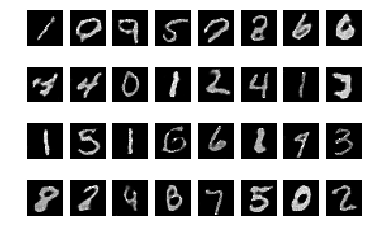

epoch =  353


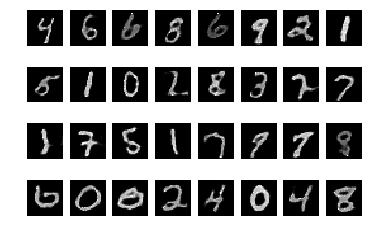

epoch =  354


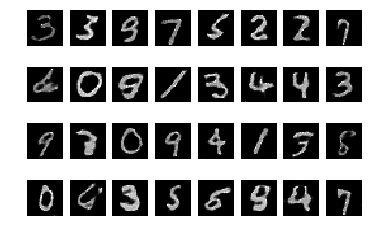

epoch =  355


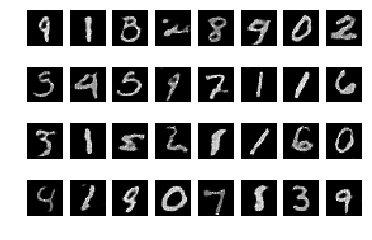

epoch =  356


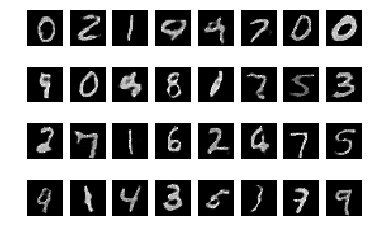

epoch =  357


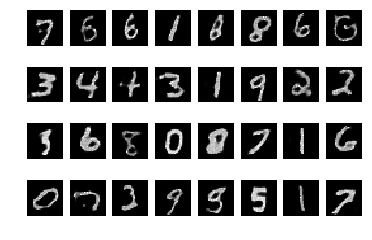

epoch =  358


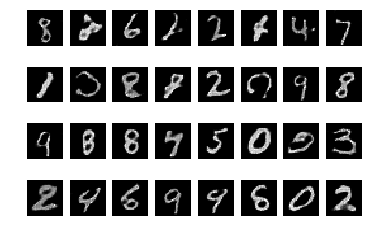

epoch =  359


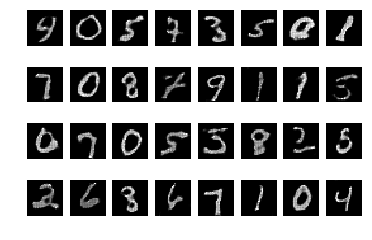

epoch =  360


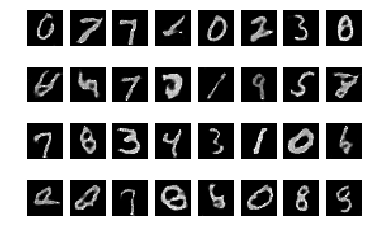

epoch =  361


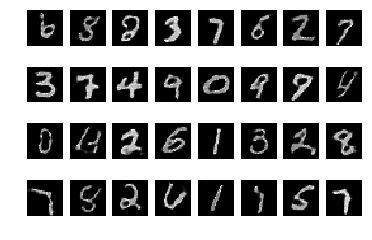

epoch =  362


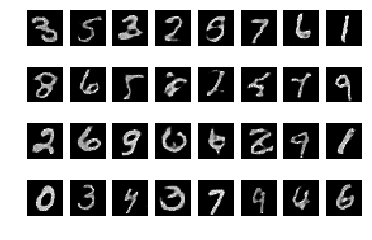

epoch =  363


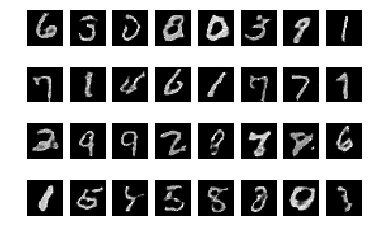

epoch =  364


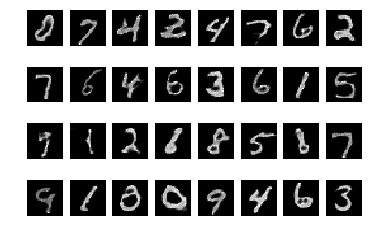

epoch =  365


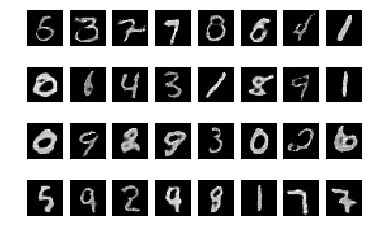

epoch =  366


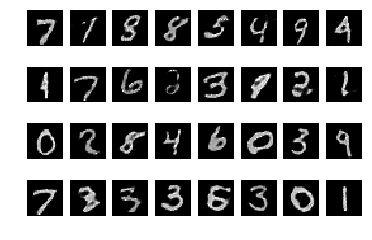

epoch =  367


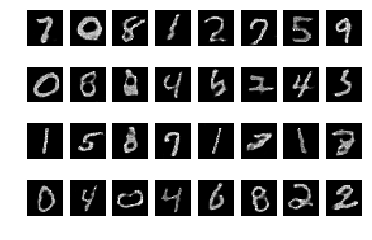

epoch =  368


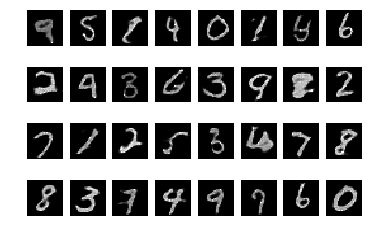

epoch =  369


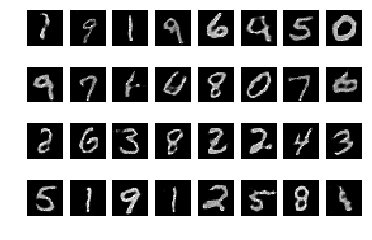

epoch =  370


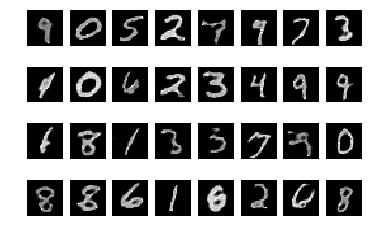

epoch =  371


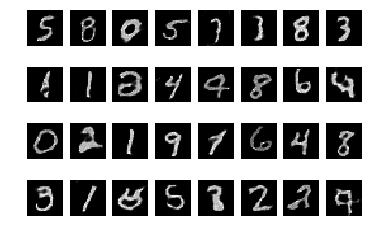

epoch =  372


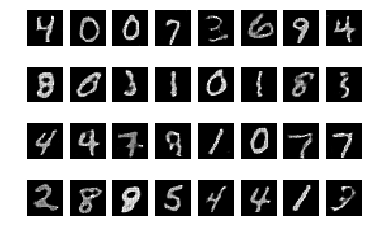

epoch =  373


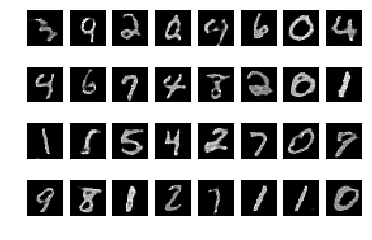

epoch =  374


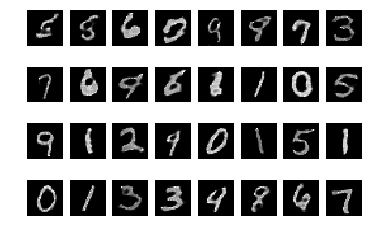

epoch =  375


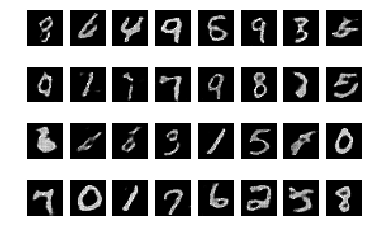

epoch =  376


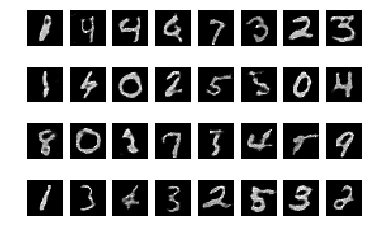

epoch =  377


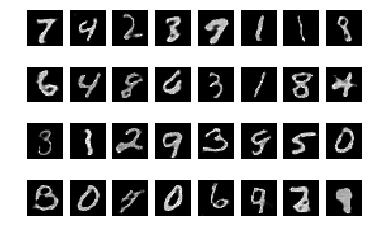

epoch =  378


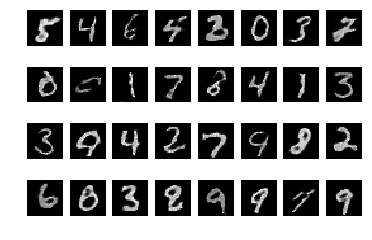

epoch =  379


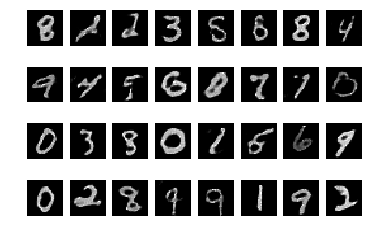

epoch =  380


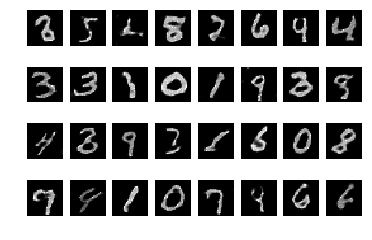

epoch =  381


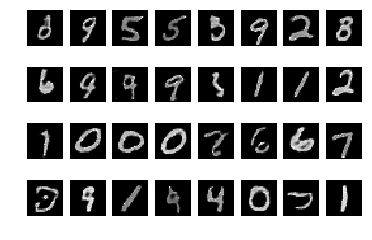

epoch =  382


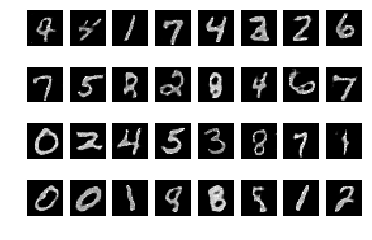

epoch =  383


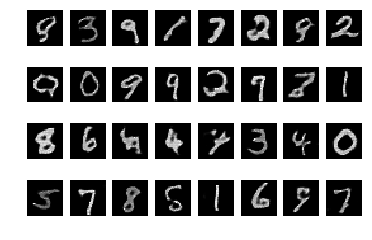

epoch =  384


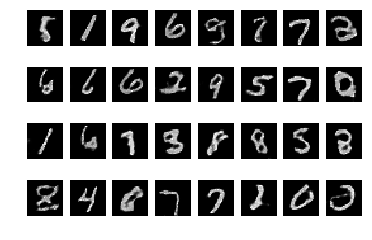

epoch =  385


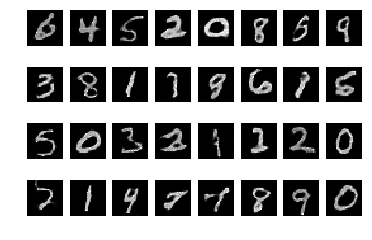

epoch =  386


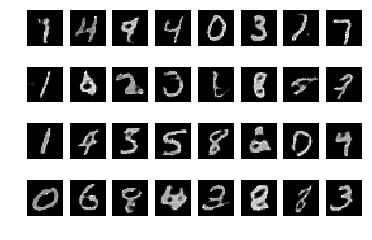

epoch =  387


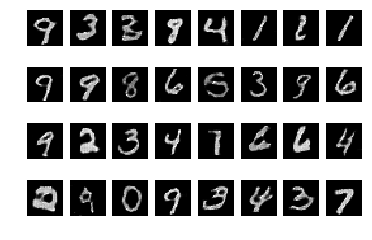

epoch =  388


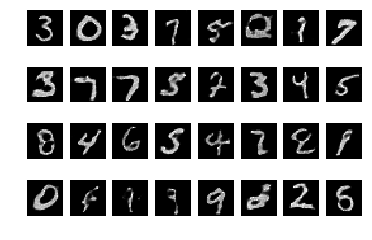

epoch =  389


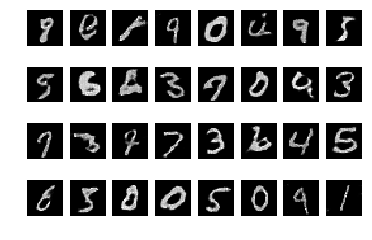

epoch =  390


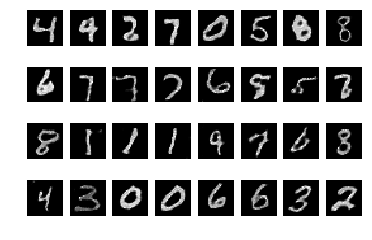

epoch =  391


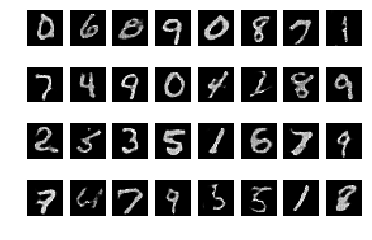

epoch =  392


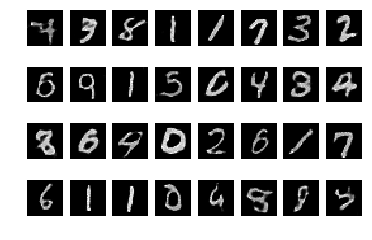

epoch =  393


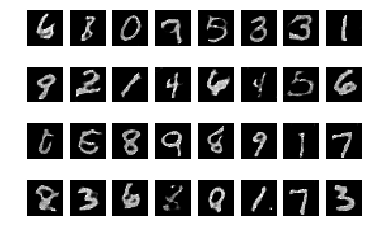

epoch =  394


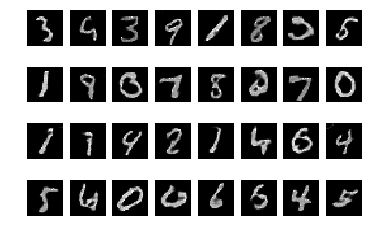

epoch =  395


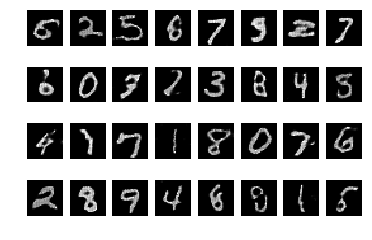

epoch =  396


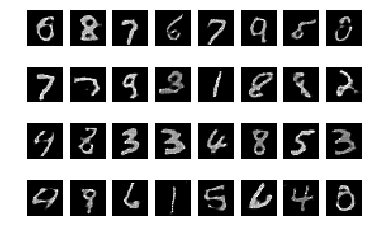

epoch =  397


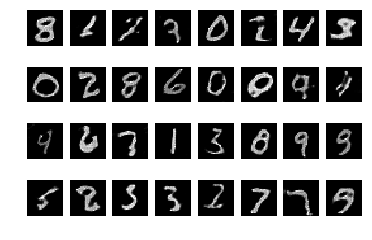

epoch =  398


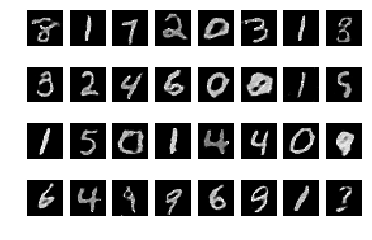

epoch =  399


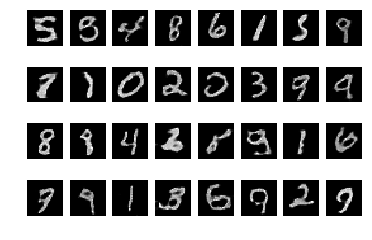

epoch =  400


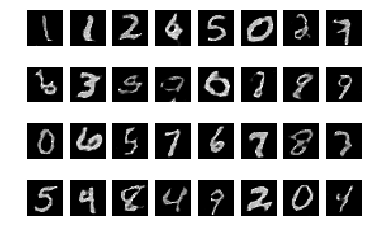

epoch =  401


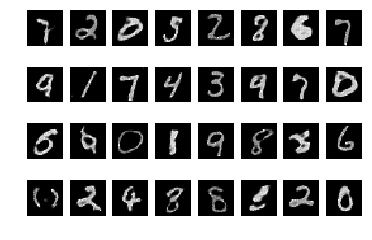

epoch =  402


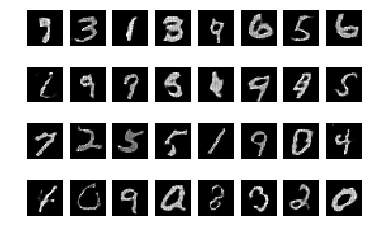

epoch =  403


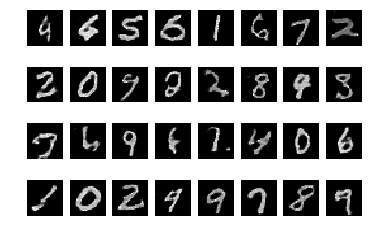

epoch =  404


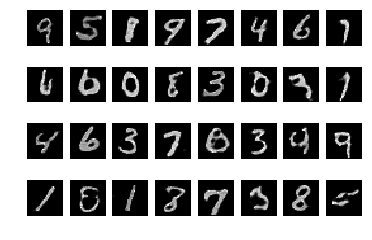

epoch =  405


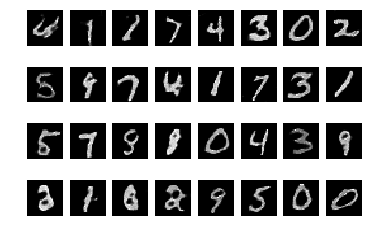

epoch =  406


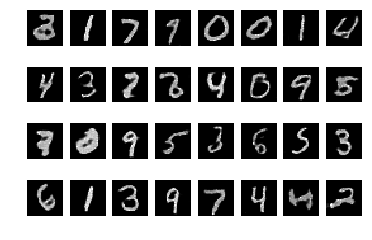

epoch =  407


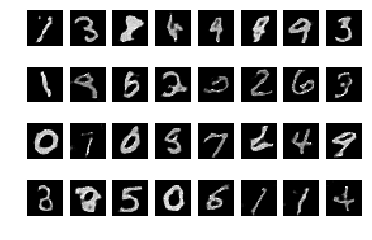

epoch =  408


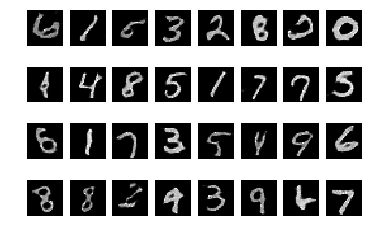

epoch =  409


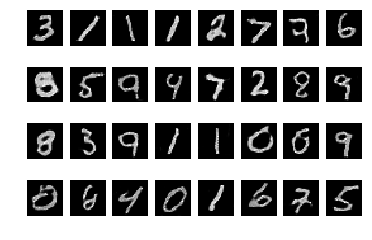

epoch =  410


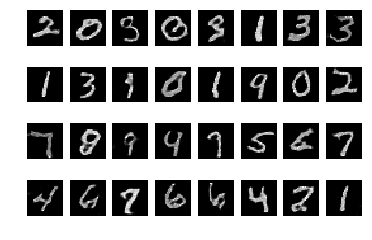

epoch =  411


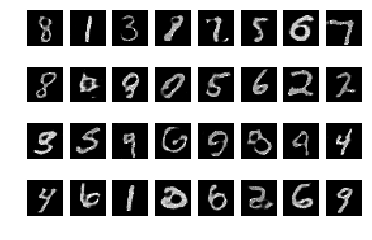

epoch =  412


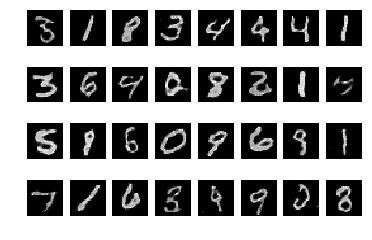

epoch =  413


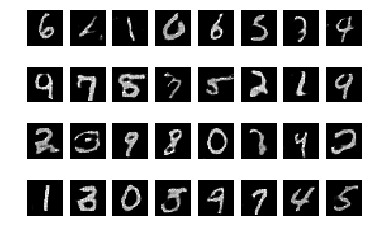

epoch =  414


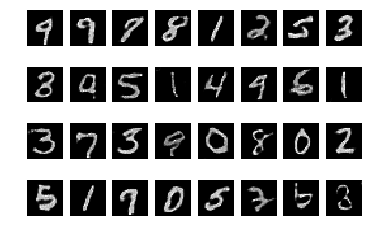

epoch =  415


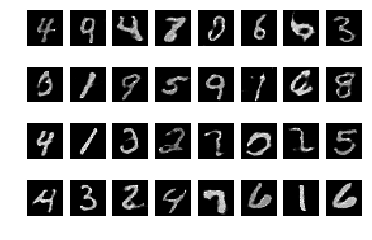

epoch =  416


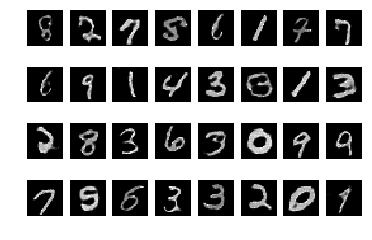

epoch =  417


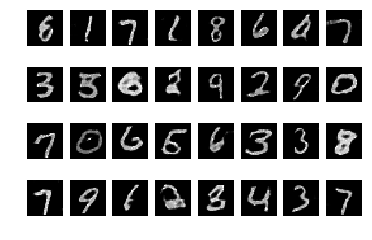

epoch =  418


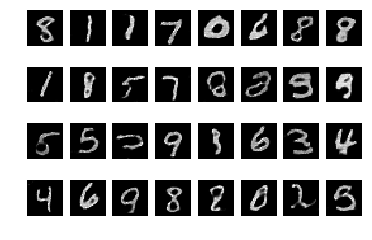

epoch =  419


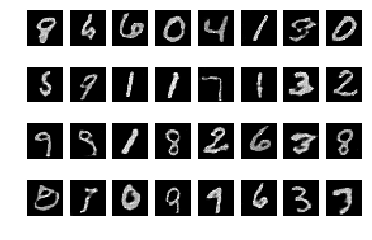

epoch =  420


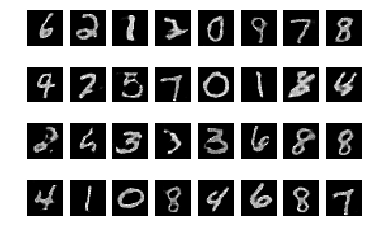

epoch =  421


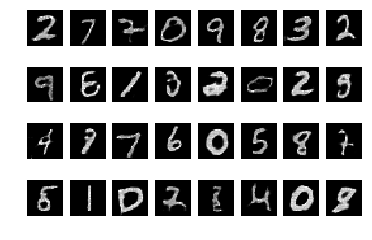

epoch =  422


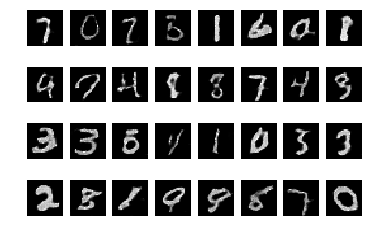

epoch =  423


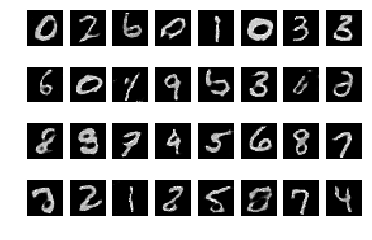

epoch =  424


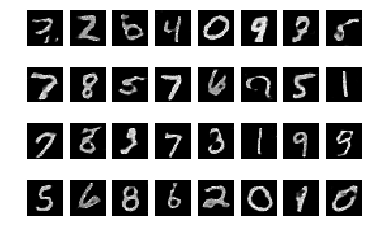

epoch =  425


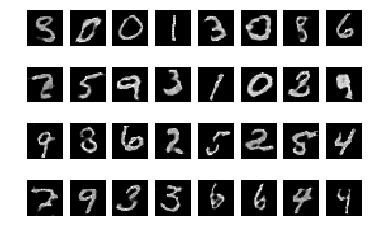

epoch =  426


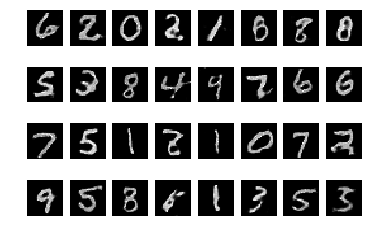

epoch =  427


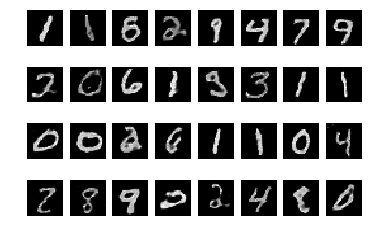

epoch =  428


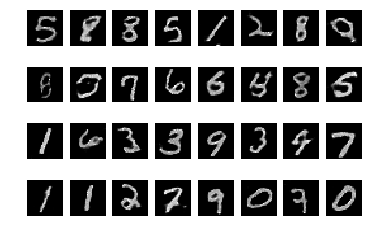

epoch =  429


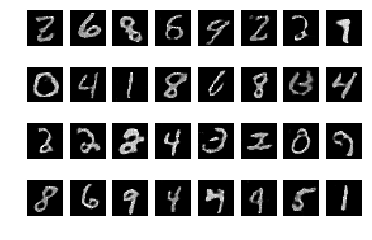

epoch =  430


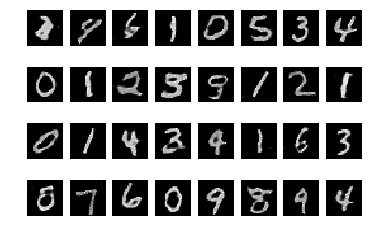

epoch =  431


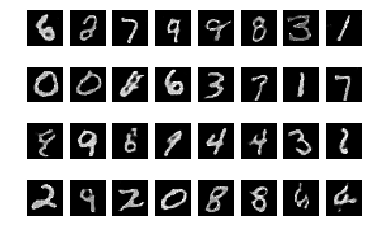

epoch =  432


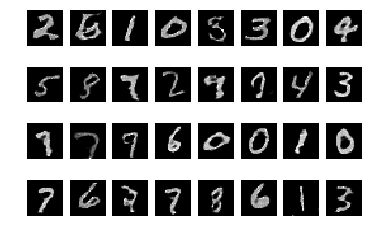

epoch =  433


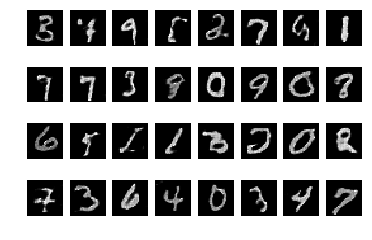

epoch =  434


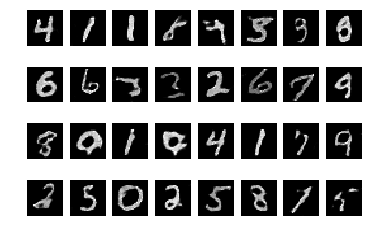

epoch =  435


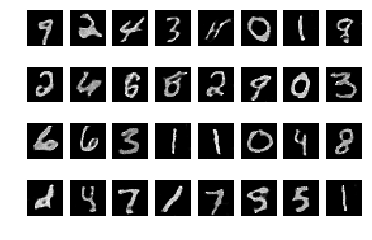

epoch =  436


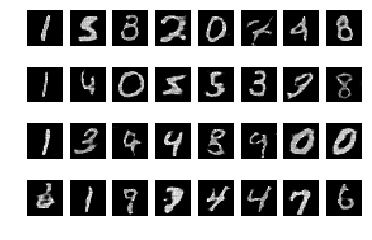

epoch =  437


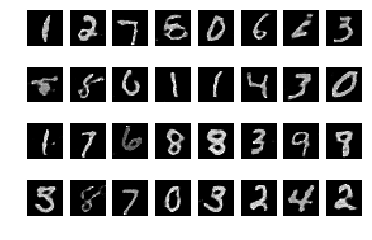

epoch =  438


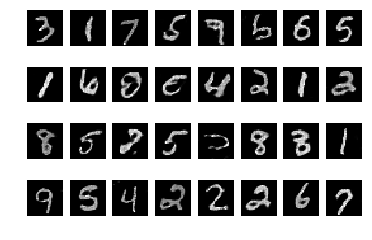

epoch =  439


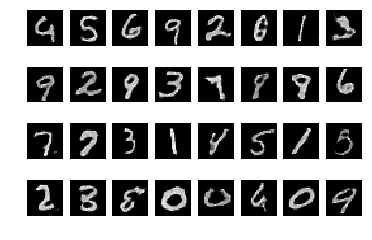

epoch =  440


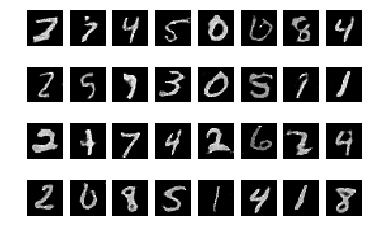

epoch =  441


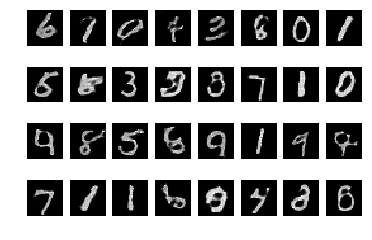

epoch =  442


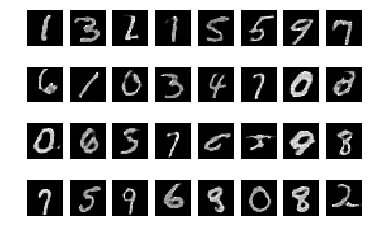

epoch =  443


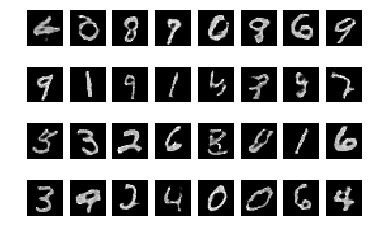

epoch =  444


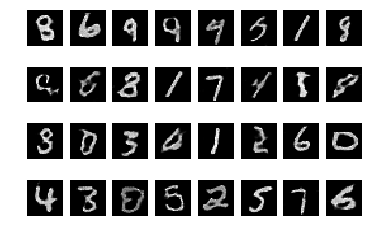

epoch =  445


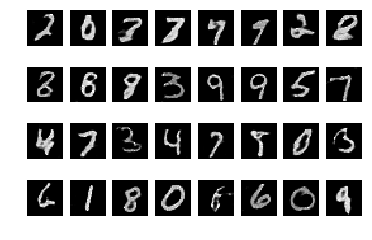

epoch =  446


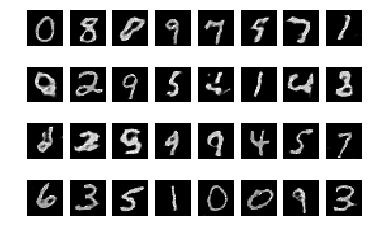

epoch =  447


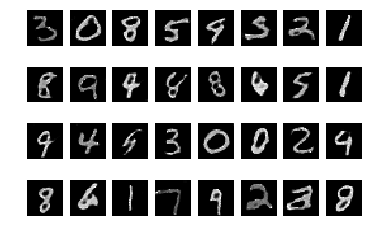

epoch =  448


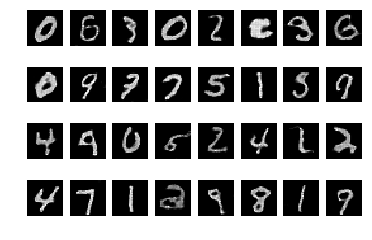

epoch =  449


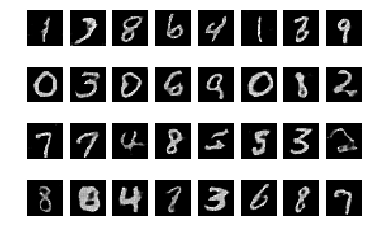

epoch =  450


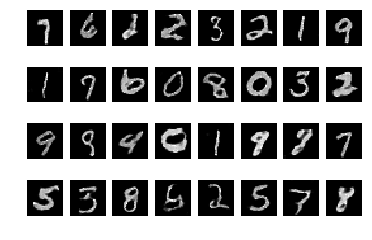

epoch =  451


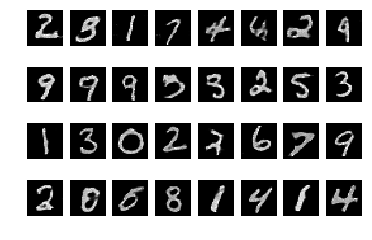

epoch =  452


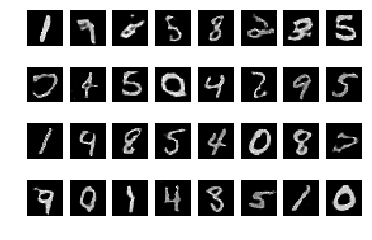

epoch =  453


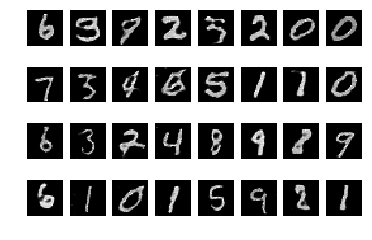

epoch =  454


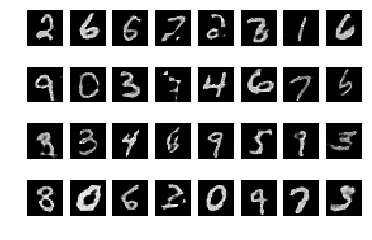

epoch =  455


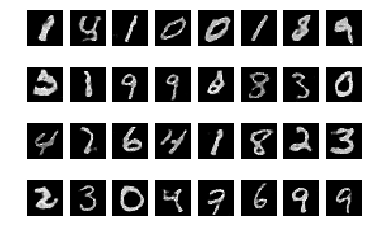

epoch =  456


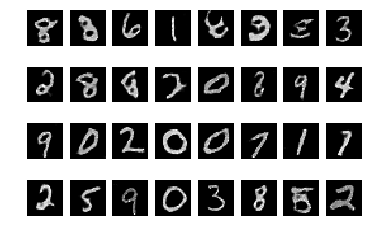

epoch =  457


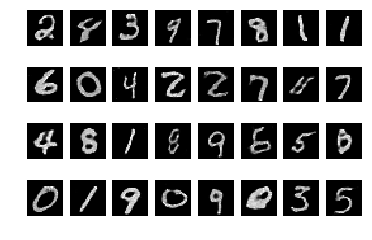

epoch =  458


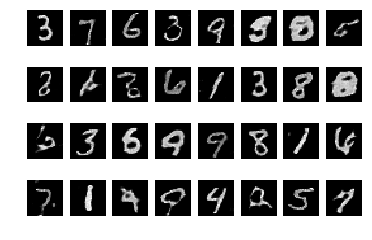

epoch =  459


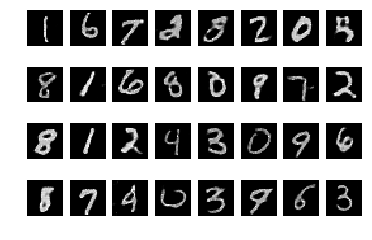

epoch =  460


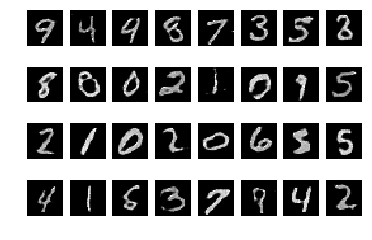

epoch =  461


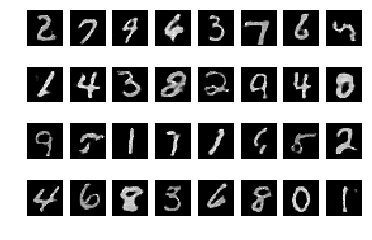

epoch =  462


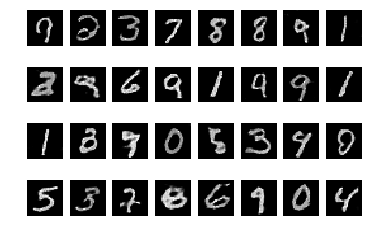

epoch =  463


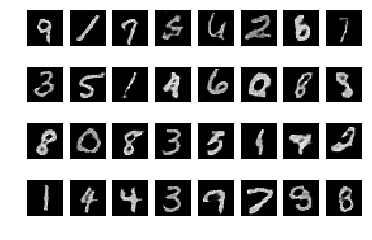

epoch =  464


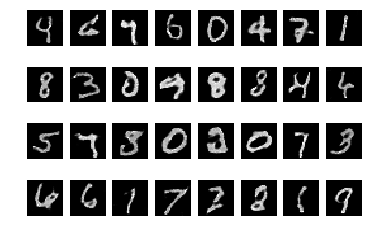

epoch =  465


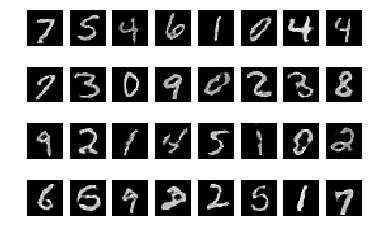

epoch =  466


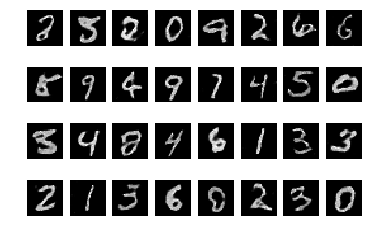

epoch =  467


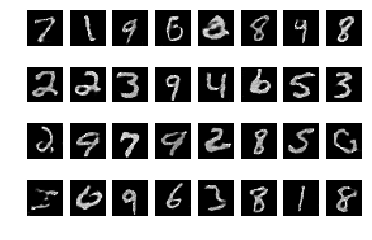

epoch =  468


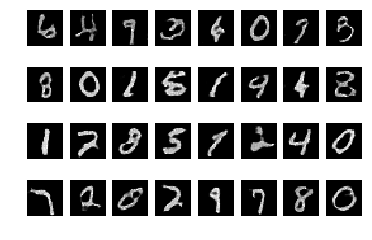

epoch =  469


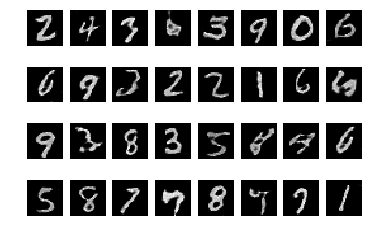

epoch =  470


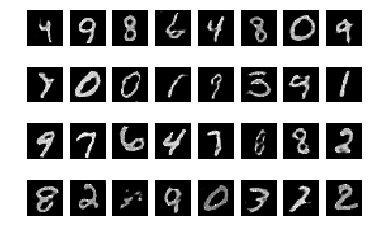

epoch =  471


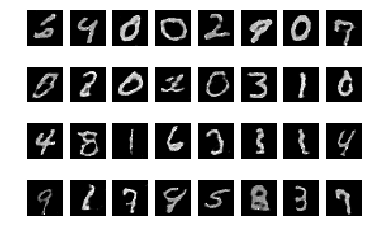

epoch =  472


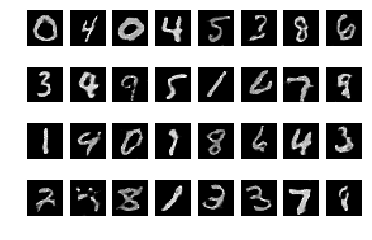

epoch =  473


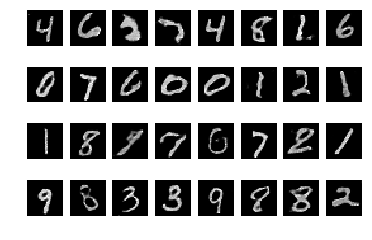

epoch =  474


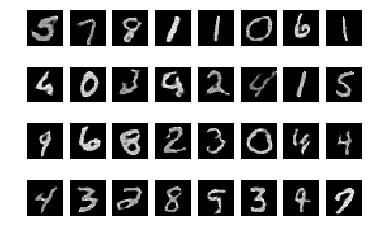

epoch =  475


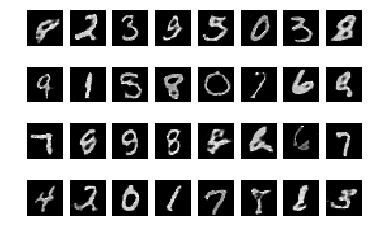

epoch =  476


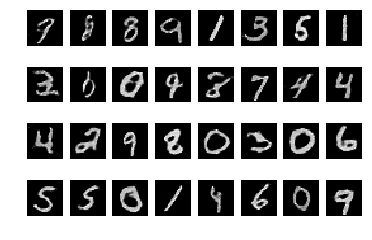

epoch =  477


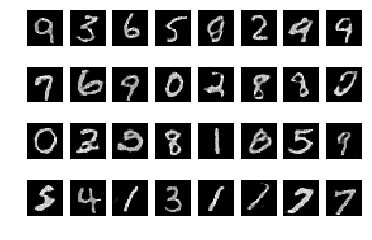

epoch =  478


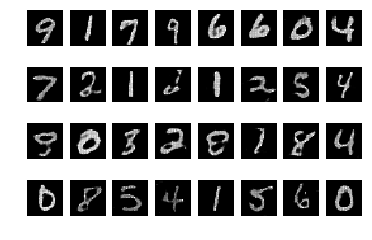

epoch =  479


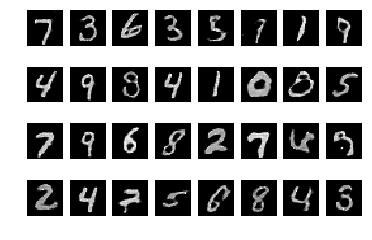

epoch =  480


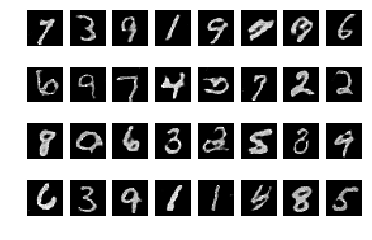

epoch =  481


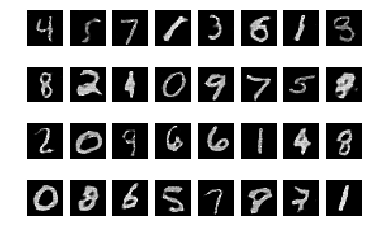

epoch =  482


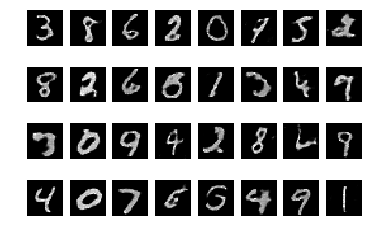

epoch =  483


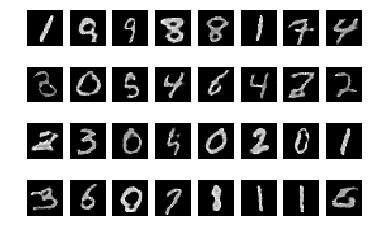

epoch =  484


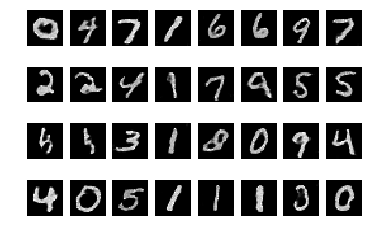

epoch =  485


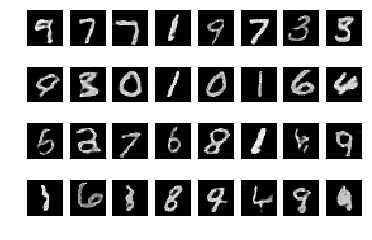

epoch =  486


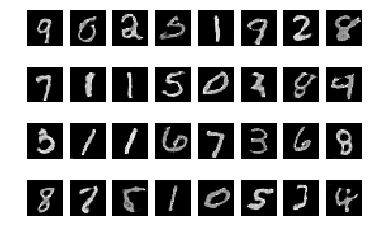

epoch =  487


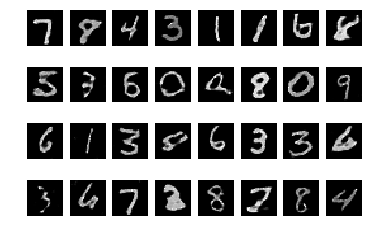

epoch =  488


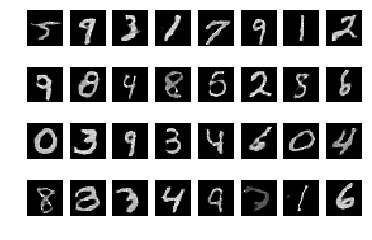

epoch =  489


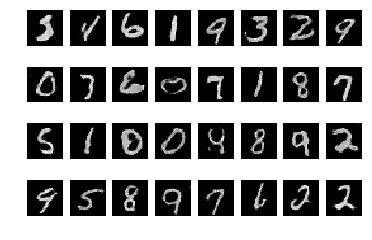

epoch =  490


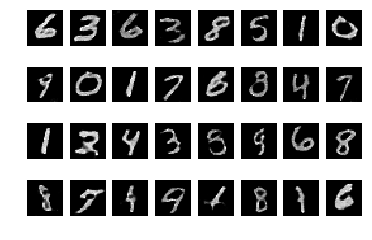

epoch =  491


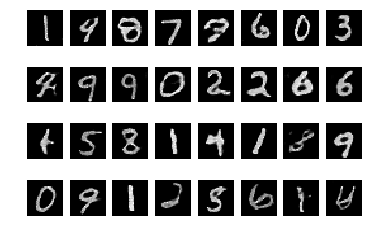

epoch =  492


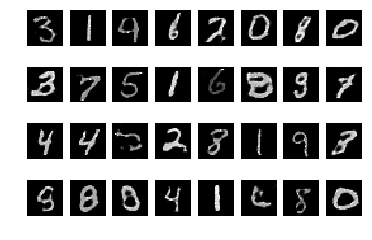

epoch =  493


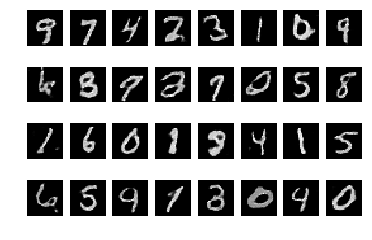

epoch =  494


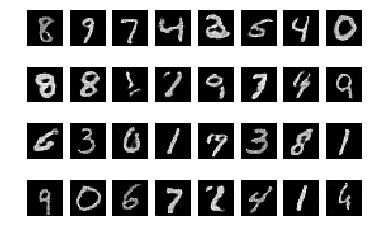

epoch =  495


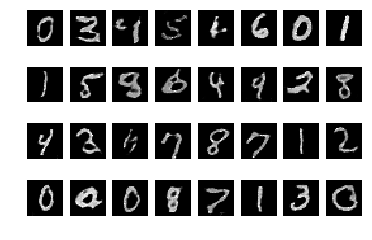

epoch =  496


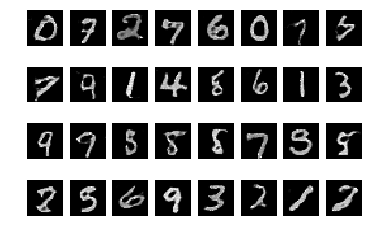

epoch =  497


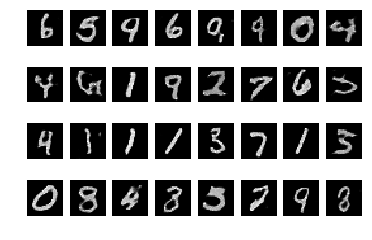

epoch =  498


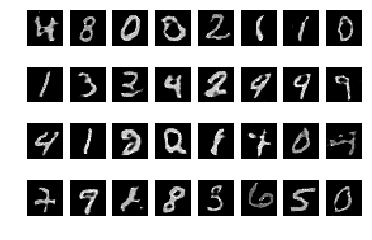

epoch =  499


In [9]:
train(mnist.test.images, 500, 128)